# Stellar Classification Model

This project aims to build and evaluate machine learning models to classify celestial objects (Stars, Galaxies, and Quasars) based on their photometric and spectroscopic properties. The dataset used for this project is sourced from the Sloan Digital Sky Survey (SDSS) and contains various measurements including position (alpha, delta), photometric magnitudes (u, g, r, i, z), and spectroscopic information (redshift). The goal is to develop an accurate model that can distinguish between these three types of celestial objects.

### Import Necessary Libraries

In [ ]:
import sklearn as sk
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings

np.warnings = warnings

### Data Exploritory Analysis

In [ ]:
df = pd.read_csv("stellar_classification.csv")

df.head()

,obj_ID,alpha,delta,u,g,r,i,z,run_ID,rerun_ID,cam_col,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID
0,1.237661e+18,135.689107,32.494632,23.87882,22.27530,20.39501,19.16573,18.79371,3606,301,2,79,6.543777e+18,GALAXY,0.634794,5812,56354,171
1,1.237665e+18,144.826101,31.274185,24.77759,22.83188,22.58444,21.16812,21.61427,4518,301,5,119,1.176014e+19,GALAXY,0.779136,10445,58158,427
2,1.237661e+18,142.188790,35.582444,25.26307,22.66389,20.60976,19.34857,18.94827,3606,301,2,120,5.152200e+18,GALAXY,0.644195,4576,55592,299
3,1.237663e+18,338.741038,-0.402828,22.13682,23.77656,21.61162,20.50454,19.25010,4192,301,3,214,1.030107e+19,GALAXY,0.932346,9149,58039,775
4,1.237680e+18,345.282593,21.183866,19.43718,17.58028,16.49747,15.97711,15.54461,8102,301,3,137,6.891865e+18,GALAXY,0.116123,6121,56187,842


In [ ]:
df.shape

(100000, 18)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 18 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   obj_ID       100000 non-null  float64
 1   alpha        100000 non-null  float64
 2   delta        100000 non-null  float64
 3   u            100000 non-null  float64
 4   g            100000 non-null  float64
 5   r            100000 non-null  float64
 6   i            100000 non-null  float64
 7   z            100000 non-null  float64
 8   run_ID       100000 non-null  int64  
 9   rerun_ID     100000 non-null  int64  
 10  cam_col      100000 non-null  int64  
 11  field_ID     100000 non-null  int64  
 12  spec_obj_ID  100000 non-null  float64
 13  class        100000 non-null  object 
 14  redshift     100000 non-null  float64
 15  plate        100000 non-null  int64  
 16  MJD          100000 non-null  int64  
 17  fiber_ID     100000 non-null  int64  
dtypes: float64(10), int64(7),

In [ ]:
df.columns

Index(['obj_ID', 'alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID',
       'rerun_ID', 'cam_col', 'field_ID', 'spec_obj_ID', 'class', 'redshift',
       'plate', 'MJD', 'fiber_ID'],
      dtype='object')

In [ ]:
df.isna().sum()

obj_ID         0
alpha          0
delta          0
u              0
g              0
r              0
i              0
z              0
run_ID         0
rerun_ID       0
cam_col        0
field_ID       0
spec_obj_ID    0
class          0
redshift       0
plate          0
MJD            0
fiber_ID       0
dtype: int64

There is no missing data.

In [ ]:
df.duplicated().sum()

0

In [ ]:
columns_to_drop = ["obj_ID","run_ID","rerun_ID","field_ID","fiber_ID","spec_obj_ID","MJD","cam_col","plate"]
df.drop(columns=columns_to_drop,inplace=True,axis=1)
df.head()

,alpha,delta,u,g,r,i,z,class,redshift
0,135.689107,32.494632,23.87882,22.27530,20.39501,19.16573,18.79371,GALAXY,0.634794
1,144.826101,31.274185,24.77759,22.83188,22.58444,21.16812,21.61427,GALAXY,0.779136
2,142.188790,35.582444,25.26307,22.66389,20.60976,19.34857,18.94827,GALAXY,0.644195
3,338.741038,-0.402828,22.13682,23.77656,21.61162,20.50454,19.25010,GALAXY,0.932346
4,345.282593,21.183866,19.43718,17.58028,16.49747,15.97711,15.54461,GALAXY,0.116123


In [ ]:
df.describe()

,alpha,delta,u,g,r,i,z,redshift
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,177.629117,24.135305,21.980468,20.531387,19.645762,19.084854,18.668810,0.576661
std,96.502241,19.644665,31.769291,31.750292,1.854760,1.757895,31.728152,0.730707
min,0.005528,-18.785328,-9999.000000,-9999.000000,9.822070,9.469903,-9999.000000,-0.009971
25%,127.518222,5.146771,20.352353,18.965230,18.135828,17.732285,17.460677,0.054517
50%,180.900700,23.645922,22.179135,21.099835,20.125290,19.405145,19.004595,0.424173
75%,233.895005,39.901550,23.687440,22.123767,21.044785,20.396495,19.921120,0.704154
max,359.999810,83.000519,32.781390,31.602240,29.571860,32.141470,29.383740,7.011245


In [ ]:
df.columns

Index(['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'class', 'redshift'], dtype='object')

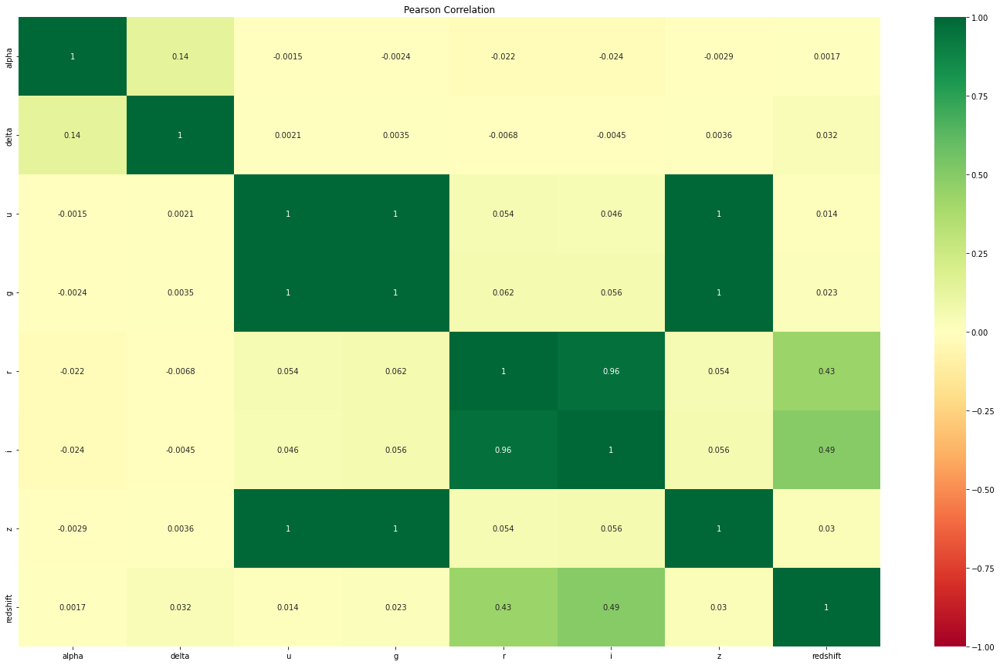

In [ ]:
corr_pearson = df.corr(numeric_only=True, method='pearson')

fig = plt.figure(figsize = (25,15))
sns.heatmap(corr_pearson, annot=True, cmap='RdYlGn',
            vmin=-1, vmax=1)
plt.title('Pearson Correlation')
plt.show()

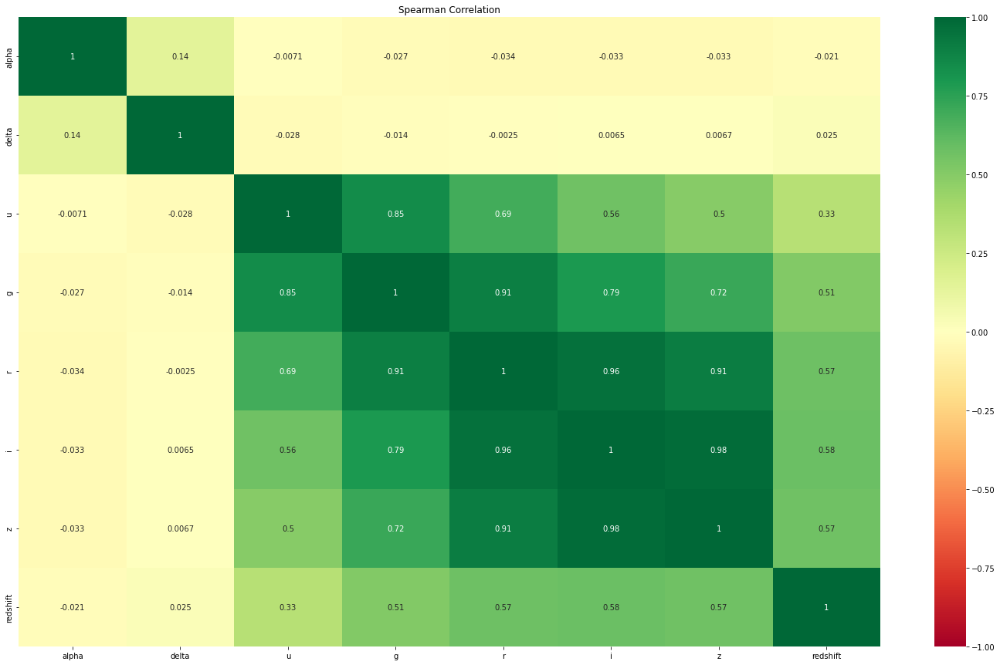

In [ ]:
corr_spearman = df.corr(numeric_only=True, method='spearman')

fig = plt.figure(figsize = (25,15))
sns.heatmap(corr_spearman, annot=True, cmap='RdYlGn',
            vmin=-1, vmax=1)
plt.title('Spearman Correlation')
plt.show()

array([[<AxesSubplot:title={'center':'alpha'}>,
        <AxesSubplot:title={'center':'delta'}>,
        <AxesSubplot:title={'center':'u'}>],
       [<AxesSubplot:title={'center':'g'}>,
        <AxesSubplot:title={'center':'r'}>,
        <AxesSubplot:title={'center':'i'}>],
       [<AxesSubplot:title={'center':'z'}>,
        <AxesSubplot:title={'center':'redshift'}>, <AxesSubplot:>]],
      dtype=object)

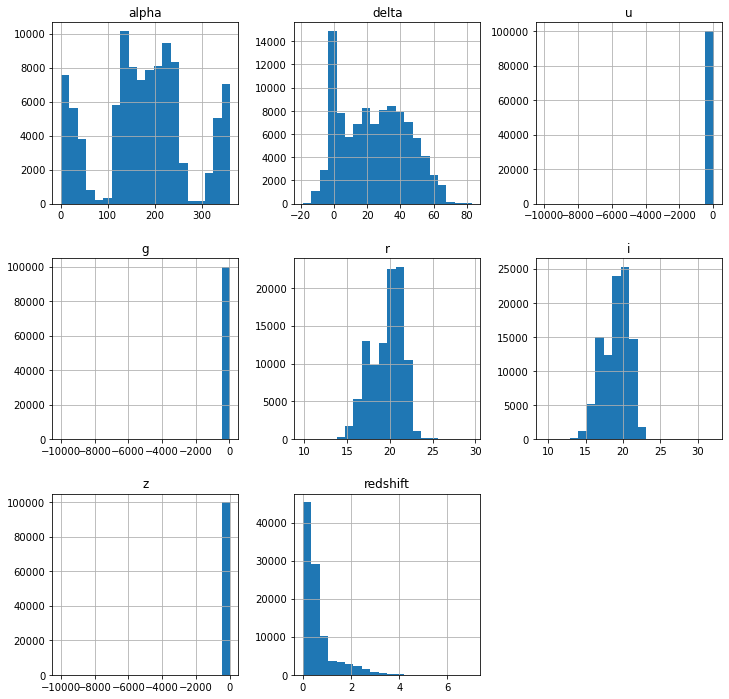

In [ ]:
df.hist(bins=20,figsize=(12,12))

The histogram shows that redshift is heavy-tailed. Skewed torwards the left. yeo-johnson will be performed to redshift.

In [ ]:
#df['redshift'] = np.log1p(df['redshift'])
from sklearn.preprocessing import PowerTransformer
test_df = df.copy()

yj_transformer = PowerTransformer(method='yeo-johnson', standardize=True)

yj_transformer.fit_transform(test_df[['redshift']])

array([[ 0.56795316],
       [ 0.78041225],
       [ 0.58312379],
       ...,
       [-0.64990216],
       [ 0.23316469],
       [ 0.40827931]])

array([[<AxesSubplot:title={'center':'redshift'}>]], dtype=object)

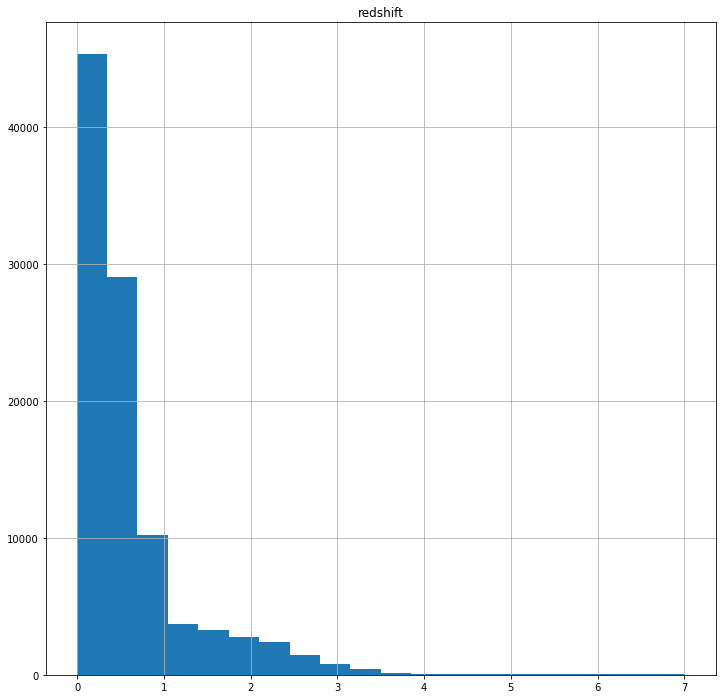

In [ ]:
test_df.hist(column=['redshift'], bins=20,figsize=(12,12))

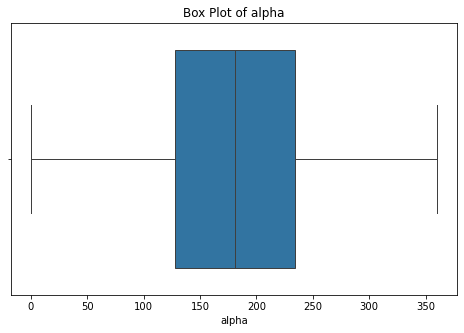

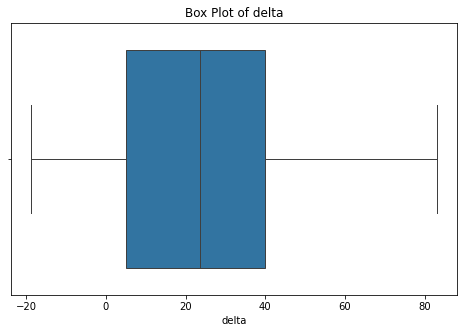

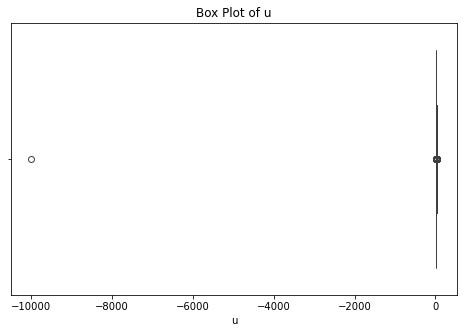

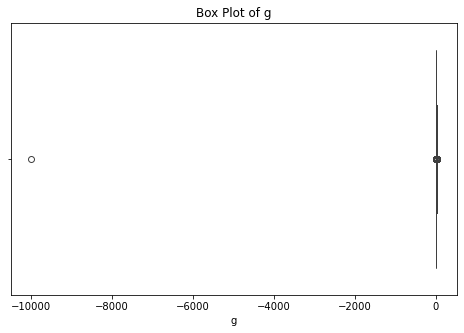

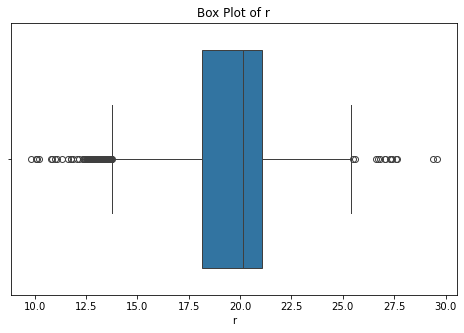

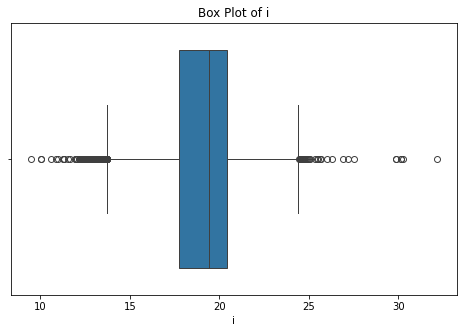

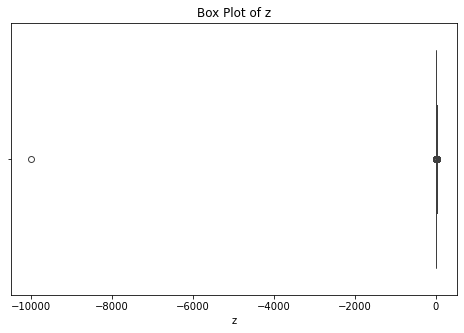

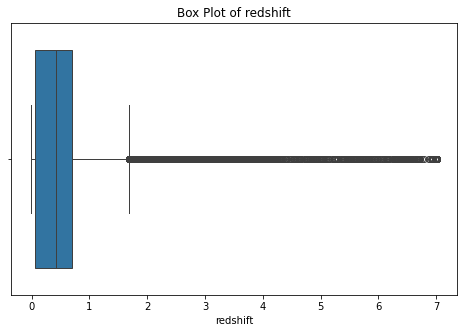

In [ ]:
for col_name in df.drop(columns=['class']).columns:
    plt.figure(figsize=(8, 5))
    sns.boxplot(x=df[col_name])
    plt.title(f'Box Plot of {col_name}')
    plt.xlabel(col_name)
    plt.show()

The box plots show that there is an extreme outlier for columns u, g, and z. This will cause a huge skew in the mean. It also shows that red is positively skewed to the right.

In [ ]:
print(df[df['u'] < -5000])

            alpha     delta       u       g        r         i       z class  \
79543  224.006526 -0.624304 -9999.0 -9999.0  18.1656  18.01675 -9999.0  STAR   

       redshift  
79543  0.000089  


The values for u, g, and r at this row are extremely negative. It's only for a single value so it's best to remove this row.

In [ ]:
df.drop(index=79543, inplace=True)

In [ ]:
df['redshift'] = np.log1p(df['redshift'])

Re-examine the values again

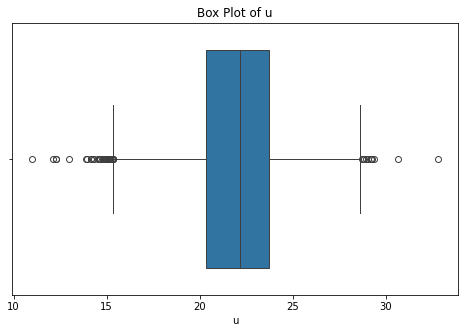

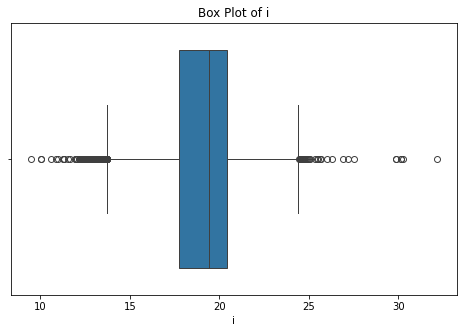

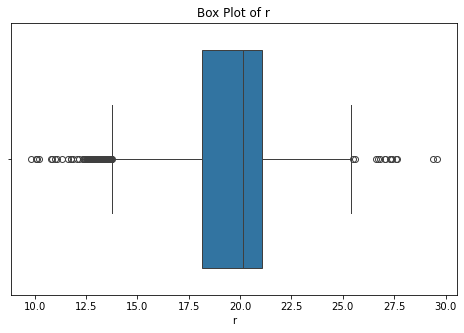

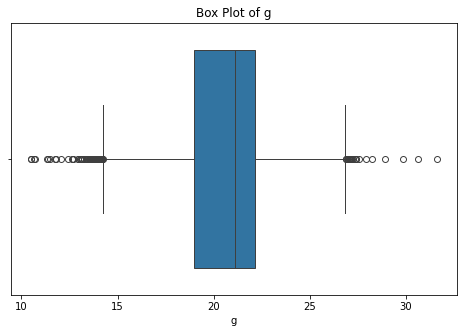

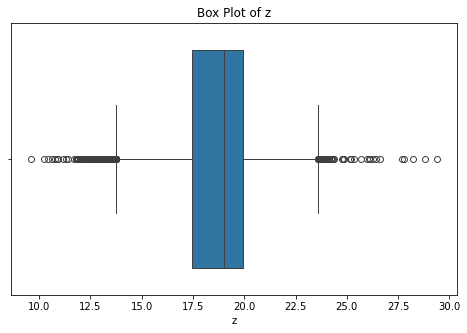

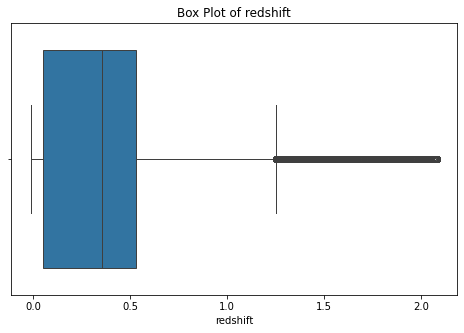

In [ ]:
for col_name in ["u","i","r","g","z", "redshift"]:
    plt.figure(figsize=(8, 5))
    sns.boxplot(x=df[col_name])
    plt.title(f'Box Plot of {col_name}')
    plt.xlabel(col_name)
    plt.show()

### Feature Engineering

#### 1) Creating Astronomical Colors

The dataset provides brightness measurements for celestial objects in five different filters:

- u (Ultraviolet)
- g (Green)
- r (Red)
- i (Near Infrared)
- z (Infrared)

These are called magnitudes. (Lesser magnitude = more bright, Greater magnitude = less bright)

#### Astronomical Colors

Astronomical colors are created by subtracting the magnitude of an object in one filter from its magnitude in another. Common astronomical colors derived from these magnitudes include:

- u-g
- g-r
- r-i
- i-z
- and combinations like u-r, g-i, etc.

These colors are important because different types of celestial objects emit light differently across the spectrum, resulting in distinct color signatures. For example, a larger g-r value indicates an object is "redder" (brighter in the red filter relative to the green filter). A smaller g-r indicates it's "bluer."

In [ ]:
df_fe = df.copy()

df_fe['u_minus_g'] = df_fe['u'] - df_fe['g']
df_fe['g_minus_r'] = df_fe['g'] - df_fe['r']
df_fe['r_minus_i'] = df_fe['r'] - df_fe['i']
df_fe['u_minus_r'] = df_fe['u'] - df_fe['r']
df_fe['g_minus_i'] = df_fe['g'] - df_fe['i']


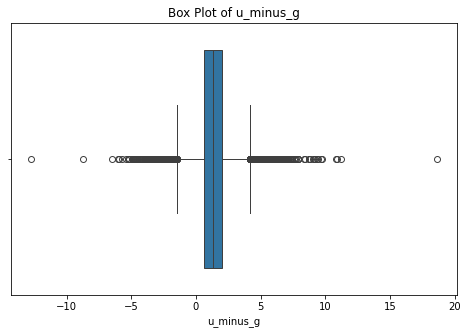

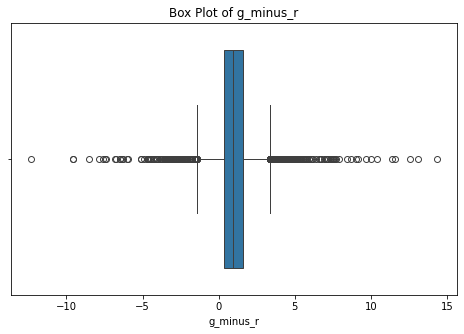

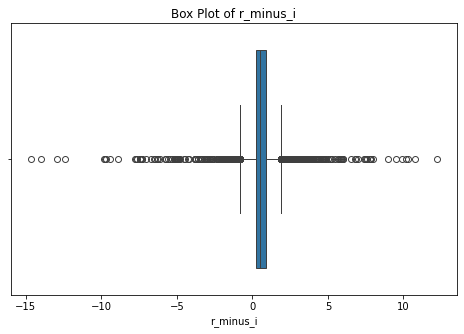

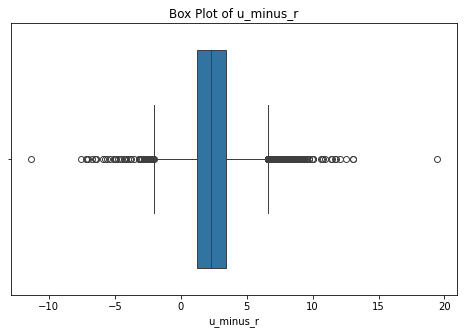

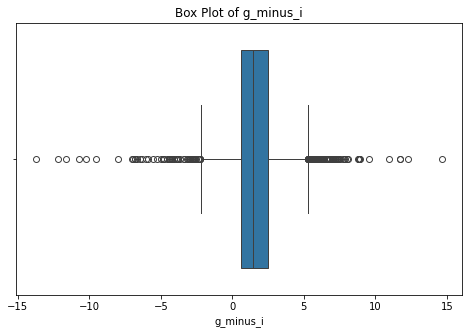

In [ ]:
for col_name in ["u_minus_g","g_minus_r","r_minus_i","u_minus_r","g_minus_i"]:
    plt.figure(figsize=(8, 5))
    sns.boxplot(x=df_fe[col_name])
    plt.title(f'Box Plot of {col_name}')
    plt.xlabel(col_name)
    plt.show() # Display the plot

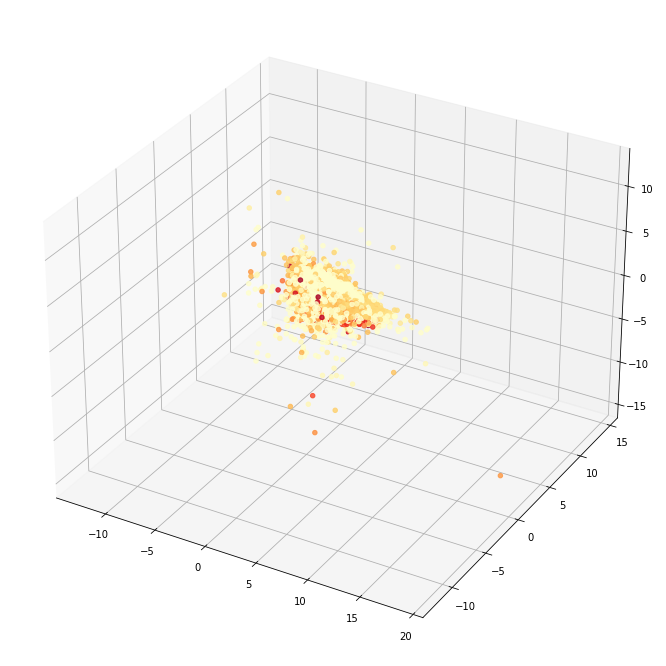

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111, projection='3d')

sc = ax.scatter(df_fe['u_minus_g'], df_fe['g_minus_r'], df_fe['r_minus_i'], c=df_fe['redshift'], cmap='YlOrRd', alpha=0.8)

In [ ]:
import plotly.express as px
fig = px.scatter_3d(
    df_fe,
    x='u_minus_g', y='g_minus_r', z='r_minus_i',
    size='i',
    color='redshift',
    color_continuous_scale='YlOrRd',
    title='3D Interactive Scatterplot: u_minus_g, g_minus_r, r_minus_i | size=i | color=redshift',
    opacity=0.5
)
fig.update_layout(scene=dict(
    xaxis_title='u_minus_g',
    yaxis_title='g_minus_r',
    zaxis_title='r_minus_i'
))
fig.show()


In [ ]:
fig2 = px.scatter(

    df_fe,
    x='u_minus_g',
    y='g_minus_r',
    size='i',
    color='redshift',
    hover_data=['u_minus_g', 'g_minus_r', 'r_minus_i', 'u_minus_r', 'redshift'],
    color_continuous_scale='YlOrRd',
    title='2D Interactive Scatterplot: u_minus_g vs g_minus_r | size=i | color=redshift',
    opacity=0.5
)
fig2.update_layout(xaxis_title='u_minus_g', yaxis_title='g_minus_r')
fig2.show()


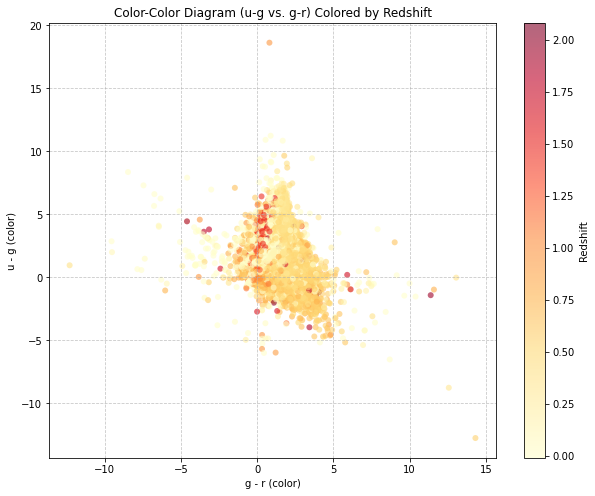

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


plt.figure(figsize=(10, 8))

scatter = plt.scatter(
    df_fe['g_minus_r'],
    df_fe['u_minus_g'],
    c=df_fe['redshift'],
    cmap='YlOrRd',
    alpha=0.6,
    edgecolors='none'
)


cbar = plt.colorbar(scatter, label='Redshift')


plt.xlabel('g - r (color)')
plt.ylabel('u - g (color)')
plt.title('Color-Color Diagram (u-g vs. g-r) Colored by Redshift')



plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

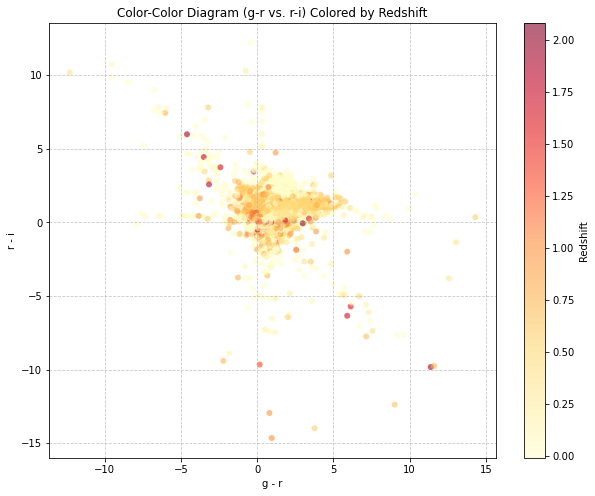

In [ ]:
plt.figure(figsize=(10, 8))

scatter2 = plt.scatter(
    df_fe['g_minus_r'],
    df_fe['r_minus_i'],
    c=df_fe['redshift'],
    cmap='YlOrRd',
    alpha=0.6,
    edgecolors='none'
)

cbar2 = plt.colorbar(scatter2, label='Redshift')

plt.xlabel('g - r')
plt.ylabel('r - i')
plt.title('Color-Color Diagram (g-r vs. r-i) Colored by Redshift')



plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

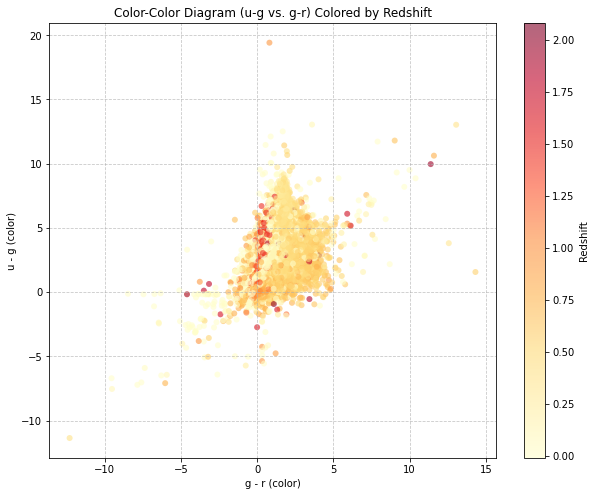

In [ ]:
plt.figure(figsize=(10, 8))

scatter3 = plt.scatter(
    df_fe['g_minus_r'],
    df_fe['u_minus_r'],
    c=df_fe['redshift'],
    cmap='YlOrRd',
    alpha=0.6,
    edgecolors='none'
)

cbar3 = plt.colorbar(scatter3, label='Redshift')

plt.xlabel('g - r (color)')
plt.ylabel('u - g (color)')
plt.title('Color-Color Diagram (u-g vs. g-r) Colored by Redshift')



plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

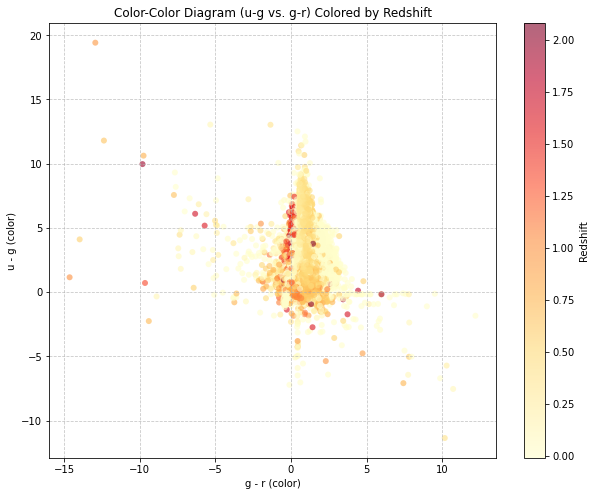

In [ ]:
plt.figure(figsize=(10, 8))

scatter4 = plt.scatter(
    df_fe['r_minus_i'],
    df_fe['u_minus_r'],
    c=df_fe['redshift'],
    cmap='YlOrRd',
    alpha=0.6,
    edgecolors='none'
)

cbar4 = plt.colorbar(scatter4, label='Redshift')

plt.xlabel('g - r (color)')
plt.ylabel('u - g (color)')
plt.title('Color-Color Diagram (u-g vs. g-r) Colored by Redshift')



plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

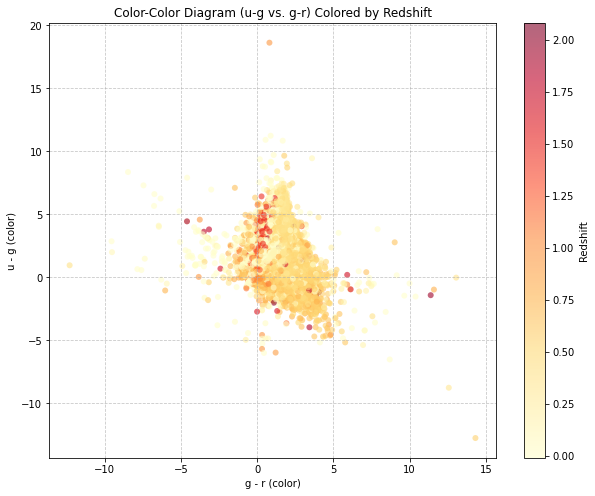

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


plt.figure(figsize=(10, 8))


scatter = plt.scatter(
    df_fe['g_minus_r'],
    df_fe['u_minus_g'],
    c=df_fe['redshift'],
    cmap='YlOrRd',
    alpha=0.6,
    edgecolors='none'
)

cbar = plt.colorbar(scatter, label='Redshift')

plt.xlabel('g - r (color)')
plt.ylabel('u - g (color)')
plt.title('Color-Color Diagram (u-g vs. g-r) Colored by Redshift')



plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

s

In [ ]:
from astropy.coordinates import SkyCoord
from astropy import units as u

coords = SkyCoord(ra=df_fe['alpha'].to_numpy()*u.degree, dec=df_fe['delta'].to_numpy()*u.degree, frame='icrs')

galactic_coords = coords.galactic



df_fe['sin_galactic_l'] = np.sin(galactic_coords.l.degree)
df_fe['abs_galactic_b'] = np.abs(galactic_coords.b.degree)



df_fe.head()

,alpha,delta,u,g,r,i,z,class,redshift,u_minus_g,g_minus_r,r_minus_i,u_minus_r,g_minus_i,sin_galactic_l,abs_galactic_b
0,135.689107,32.494632,23.87882,22.27530,20.39501,19.16573,18.79371,GALAXY,0.491517,1.60352,1.88029,1.22928,3.48381,3.10957,-0.450298,40.686903
1,144.826101,31.274185,24.77759,22.83188,22.58444,21.16812,21.61427,GALAXY,0.576128,1.94571,0.24744,1.41632,2.19315,1.66376,0.537623,48.191106
2,142.188790,35.582444,25.26307,22.66389,20.60976,19.34857,18.94827,GALAXY,0.497251,2.59918,2.05413,1.26119,4.65331,3.31532,0.226215,46.390549
3,338.741038,-0.402828,22.13682,23.77656,21.61162,20.50454,19.25010,GALAXY,0.658735,-1.63974,2.16494,1.10708,0.52520,3.27202,-0.441774,47.730634
4,345.282593,21.183866,19.43718,17.58028,16.49747,15.97711,15.54461,GALAXY,0.109861,1.85690,1.08281,0.52036,2.93971,1.60317,-0.109577,34.805597


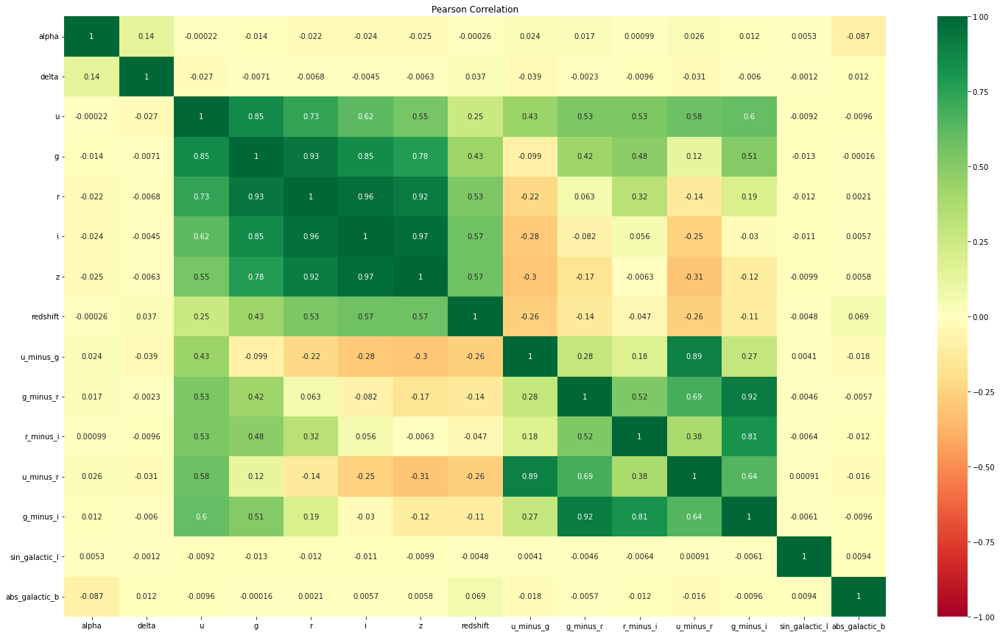

In [ ]:
corr_pearson = df_fe.corr(numeric_only=True, method='pearson')

fig = plt.figure(figsize = (25,15))
sns.heatmap(corr_pearson, annot=True, cmap='RdYlGn',
            vmin=-1, vmax=1)
plt.title('Pearson Correlation')
plt.show()

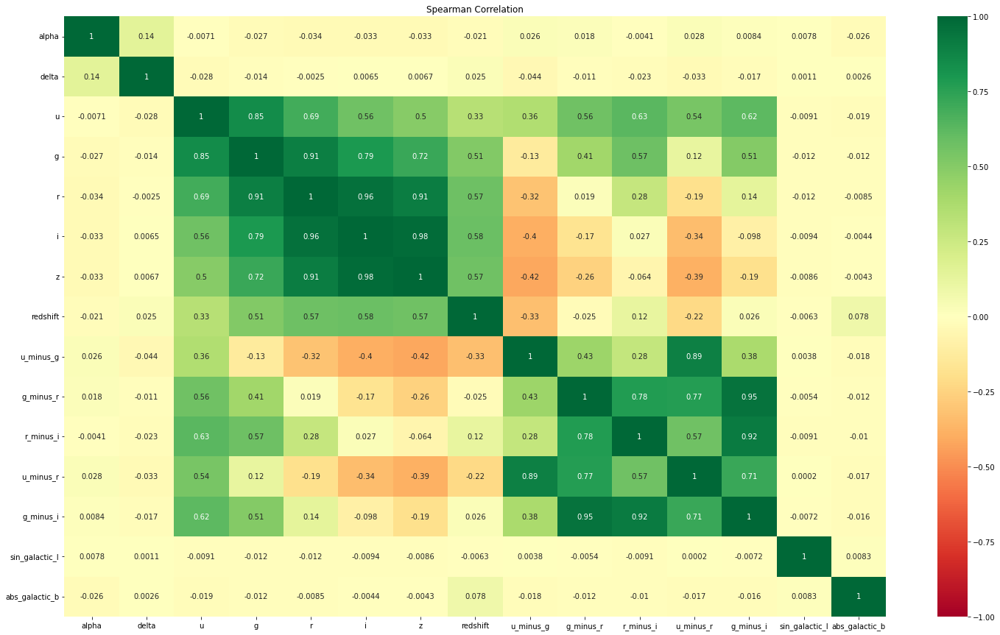

In [ ]:
corr_spearman = df_fe.corr(numeric_only=True, method='spearman')

fig = plt.figure(figsize = (25,15))
sns.heatmap(corr_spearman, annot=True, cmap='RdYlGn',
            vmin=-1, vmax=1)
plt.title('Spearman Correlation')
plt.show()

The Pearson Correlation heatmap shows strong positive linear correlations between the magnitude features (`u`, `g`, `r`, `i`, `z`) and some negative linear correlations with the engineered features.

The Spearman Correlation heatmap shows similar results to Pearson's Correlation heatmap.

The galactic longitude and latitude don't show much correlation with any of the features.

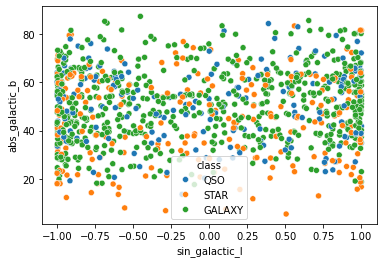

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt


df_sample = df_fe.sample(n=1000, random_state=42)
sns.scatterplot(x='sin_galactic_l', y='abs_galactic_b', hue='class', data=df_sample)
plt.show()

There doesn't seem to be any correlation between the galactic longitude/latitude and the classes

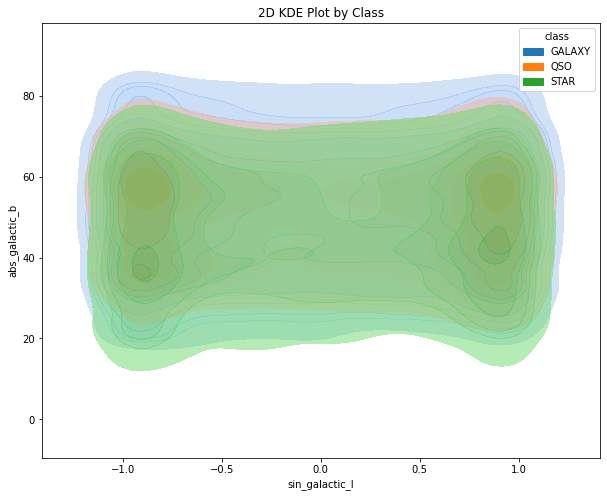

In [ ]:
plt.figure(figsize=(10, 8))
sns.kdeplot(data=df_fe, x='sin_galactic_l', y='abs_galactic_b', hue='class', fill=True, alpha=0.5, thresh=0.05)
plt.title('2D KDE Plot by Class')
plt.show()

The KDE plot shows that majority of the classes overlap with some stars having lesser galactic latitude

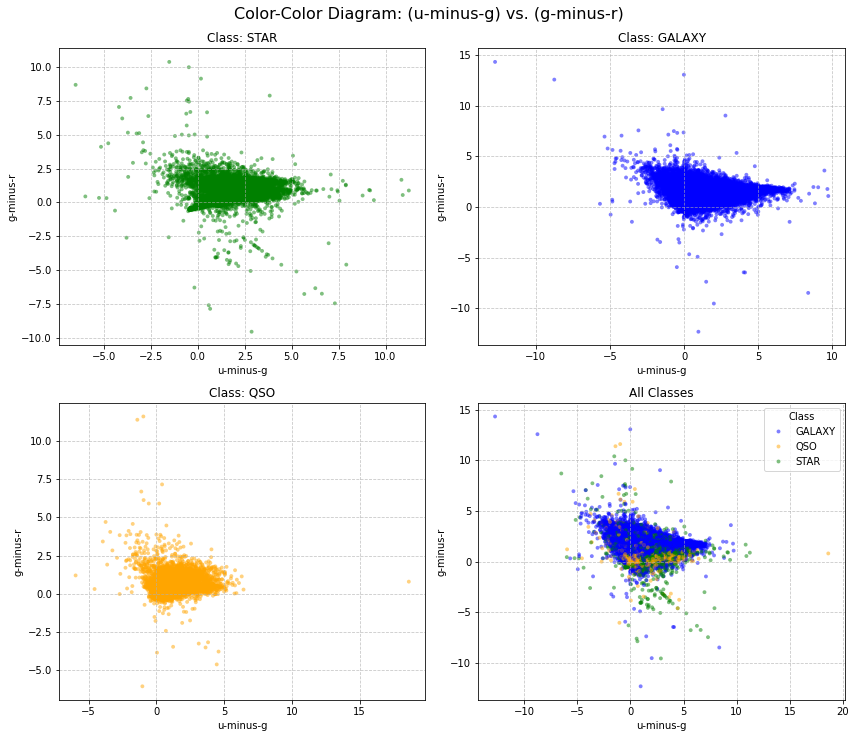

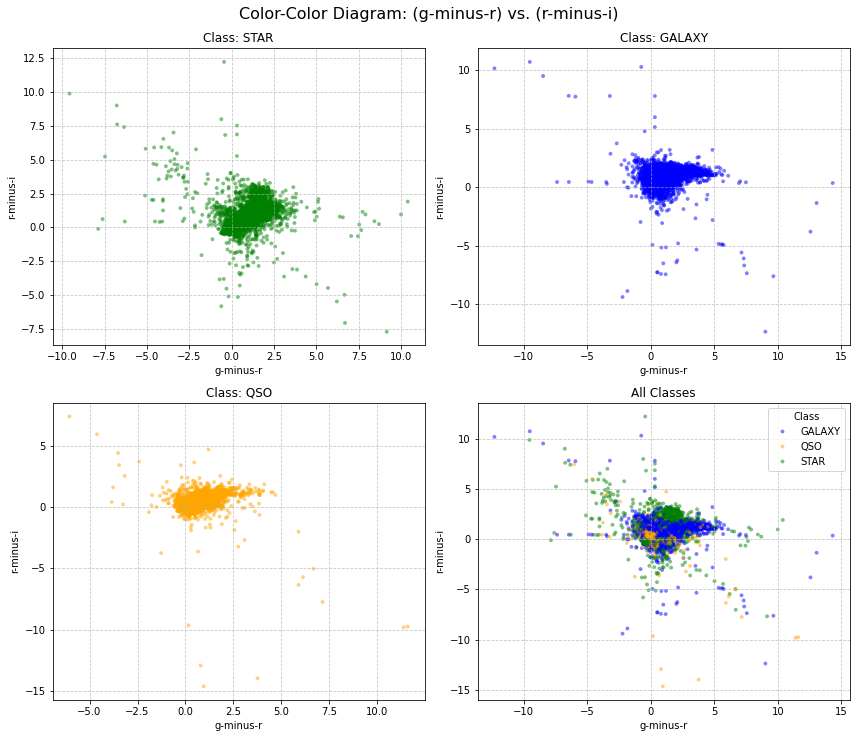

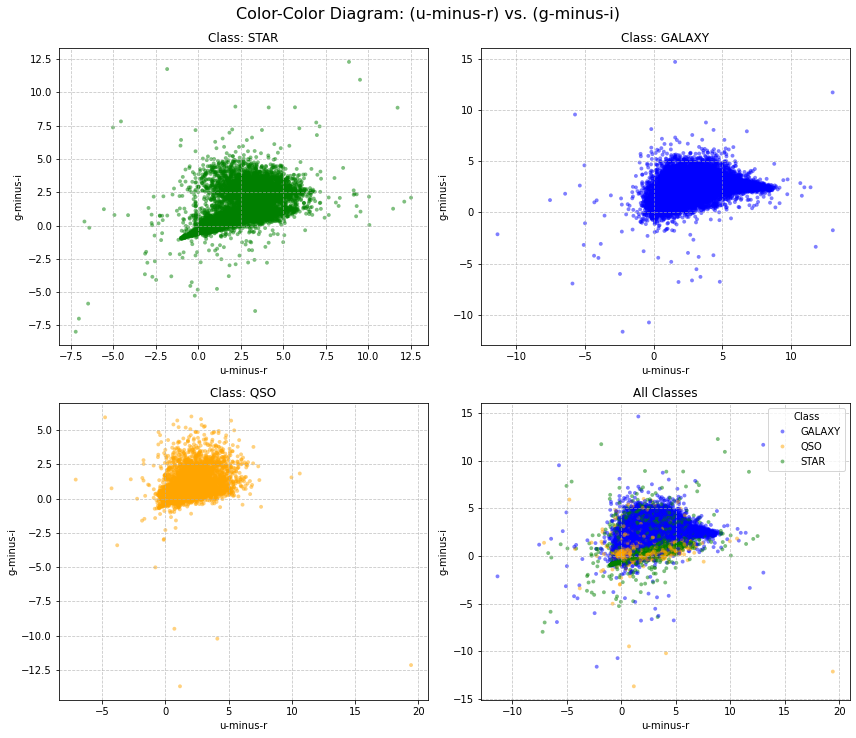

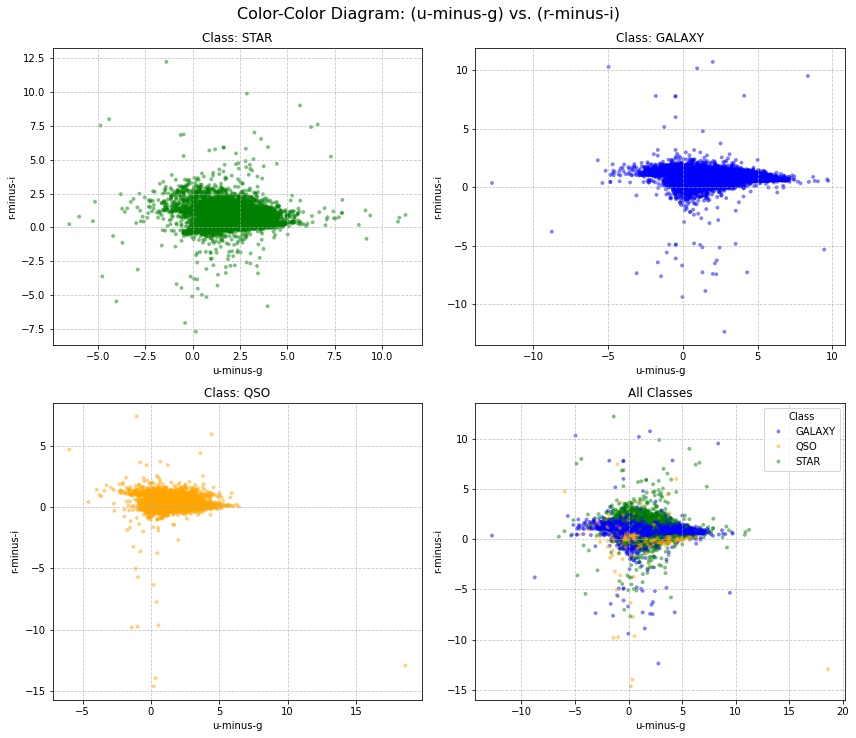

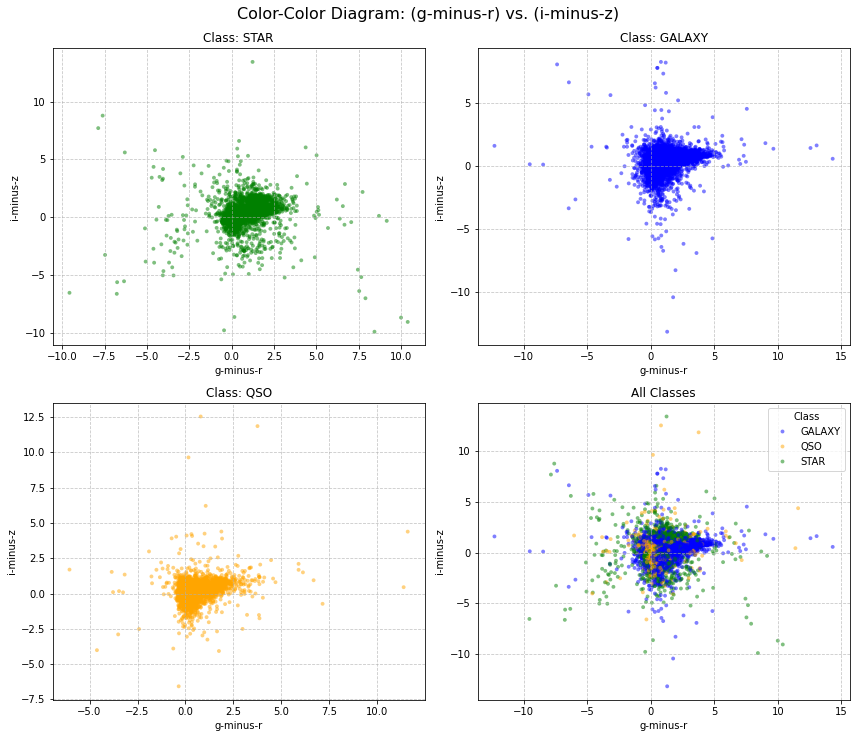

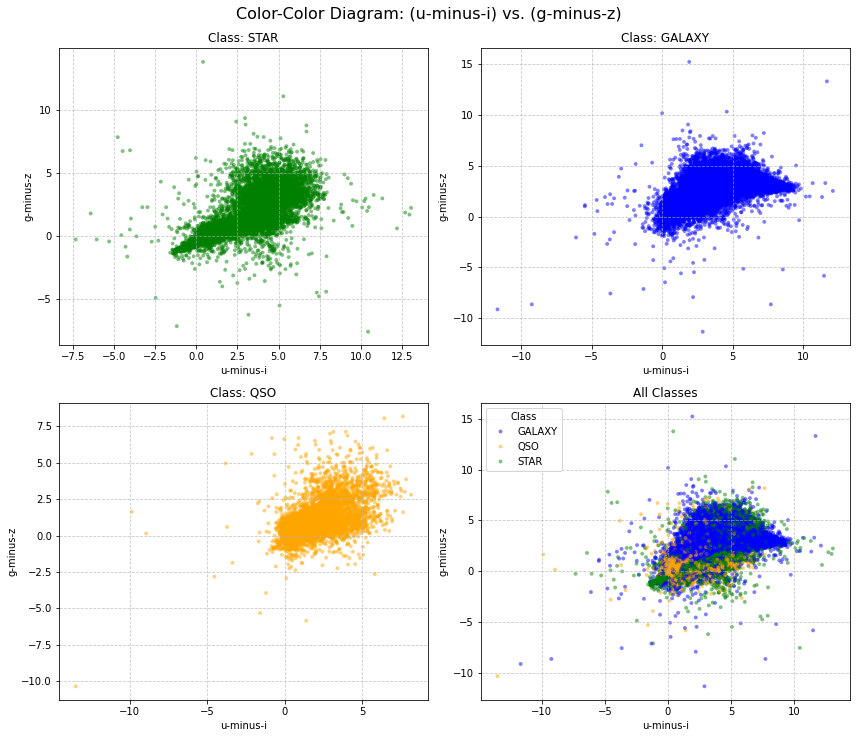

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

if 'u_minus_g' not in df_fe.columns:
    df_fe['u_minus_g'] = df_fe['u'] - df_fe['g']
if 'g_minus_r' not in df_fe.columns:
    df_fe['g_minus_r'] = df_fe['g'] - df_fe['r']
if 'r_minus_i' not in df_fe.columns:
    df_fe['r_minus_i'] = df_fe['r'] - df_fe['i']
if 'u_minus_r' not in df_fe.columns:
     df_fe['u_minus_r'] = df_fe['u'] - df_fe['r']
if 'g_minus_i' not in df_fe.columns:
     df_fe['g_minus_i'] = df_fe['g'] - df_fe['i']
if 'i_minus_z' not in df_fe.columns:
     df_fe['i_minus_z'] = df_fe['i'] - df_fe['z']
if 'u_minus_i' not in df_fe.columns:
     df_fe['u_minus_i'] = df_fe['u'] - df_fe['i']
if 'g_minus_z' not in df_fe.columns:
     df_fe['g_minus_z'] = df_fe['g'] - df_fe['z']


# Define the color combinations to plot
color_combinations = [
    ('u_minus_g', 'g_minus_r'),
    ('g_minus_r', 'r_minus_i'),
    ('u_minus_r', 'g_minus_i'),
    ('u_minus_g', 'r_minus_i'),
    ('g_minus_r', 'i_minus_z'),
    ('u_minus_i', 'g_minus_z')
]

# Define the color mapping: Class -> Color
class_colors = {
    'GALAXY': 'blue',
    'QSO': 'orange',
    'STAR': 'green'
}

# Get unique classes
classes = df_fe['class'].unique()

# Loop through each color combination to create a set of 4 plots
for color_x, color_y in color_combinations:
    # Create a figure and a 2x2 grid of axes for this combination
    fig, axes = plt.subplots(2, 2, figsize=(12, 10))
    axes = axes.flatten() # Flatten the 2D array of axes

    # Plot for Stars (using its assigned color)
    ax1 = axes[0]
    df_stars = df_fe[df_fe['class'] == 'STAR']
    sns.scatterplot(data=df_stars, x=color_x, y=color_y, color=class_colors['STAR'], alpha=0.5, s=15, edgecolor='none', ax=ax1)
    ax1.set_title(f'Class: STAR')
    ax1.set_xlabel(color_x.replace('_', '-'))
    ax1.set_ylabel(color_y.replace('_', '-'))
    ax1.grid(True, linestyle='--', alpha=0.7)

    # Plot for Galaxies (using its assigned color)
    ax2 = axes[1]
    df_galaxies = df_fe[df_fe['class'] == 'GALAXY']
    sns.scatterplot(data=df_galaxies, x=color_x, y=color_y, color=class_colors['GALAXY'], alpha=0.5, s=15, edgecolor='none', ax=ax2)
    ax2.set_title(f'Class: GALAXY')
    ax2.set_xlabel(color_x.replace('_', '-'))
    ax2.set_ylabel(color_y.replace('_', '-'))
    ax2.grid(True, linestyle='--', alpha=0.7)

    # Plot for Quasars (using its assigned color)
    ax3 = axes[2]
    df_quasars = df_fe[df_fe['class'] == 'QSO']
    sns.scatterplot(data=df_quasars, x=color_x, y=color_y, color=class_colors['QSO'], alpha=0.5, s=15, edgecolor='none', ax=ax3)
    ax3.set_title(f'Class: QSO')
    ax3.set_xlabel(color_x.replace('_', '-'))
    ax3.set_ylabel(color_y.replace('_', '-'))
    ax3.grid(True, linestyle='--', alpha=0.7)


    # --- Plot all classes together (using the defined palette) ---
    ax4 = axes[3]
    sns.scatterplot(data=df_fe, x=color_x, y=color_y, hue='class', palette=class_colors, alpha=0.5, s=15, edgecolor='none', ax=ax4)
    ax4.set_title(f'All Classes')
    ax4.set_xlabel(color_x.replace('_', '-'))
    ax4.set_ylabel(color_y.replace('_', '-'))
    ax4.grid(True, linestyle='--', alpha=0.7)
    # Add legend to the combined plot only
    ax4.legend(title='Class', loc='best', markerscale=1)


    plt.tight_layout()
    plt.suptitle(f'Color-Color Diagram: ({color_x.replace("_", "-")}) vs. ({color_y.replace("_", "-")})', y=1.02, fontsize=16)
    plt.show()

### Color-Color Diagram Analysis

Color-color diagrams, which plot the difference in magnitude between two astronomical filters (colors) on the axes, are valuable tools for classifying celestial objects. By examining various color combinations (e.g., u-g vs. g-r, g-r vs. r-i), we can observe how different types of objects cluster in these diagrams.

Our analysis of the color-color diagrams reveals distinct separation patterns for Stars, Galaxies, and Quasars:

*   **Stars:** Tend to occupy a more concentrated region in the color-color space, often forming a relatively narrow sequence. Their colors are primarily related to their surface temperature.
*   **Galaxies:** Generally show a wider distribution in color-color space compared to stars. Their colors are influenced by the mix of stars within them, their star formation history, and dust extinction.
*   **Quasars (QSOs):** Typically exhibit unique color characteristics due to the strong emission from their active galactic nuclei. They often occupy distinct regions in color-color diagrams, particularly in those involving ultraviolet and blue filters (like u-g).

While there is some overlap between the classes in certain color-color combinations, these diagrams provide strong visual evidence that astronomical colors are powerful features for distinguishing between Stars, Galaxies, and Quasars. This supports their use as input features for the classification model. The interactive plots (3D and 2D) further highlight these separation patterns.

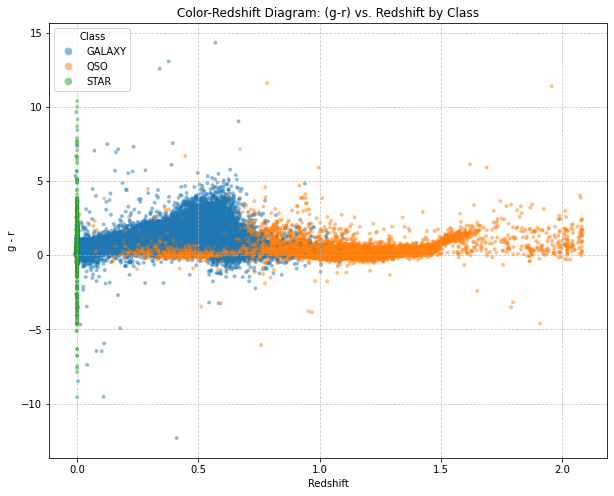

In [ ]:
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df_fe, x='redshift', y='g_minus_r', hue='class', alpha=0.5, s=15, edgecolor='none')
plt.title('Color-Redshift Diagram: (g-r) vs. Redshift by Class')
plt.xlabel('Redshift')
plt.ylabel('g - r')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Class', markerscale=2)
plt.show()

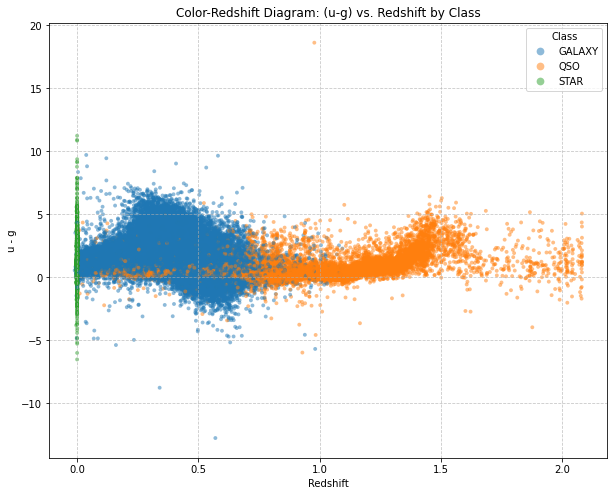

In [ ]:
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df_fe, x='redshift', y='u_minus_g', hue='class', alpha=0.5, s=15, edgecolor='none')
plt.title('Color-Redshift Diagram: (u-g) vs. Redshift by Class')
plt.xlabel('Redshift')
plt.ylabel('u - g')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Class', markerscale=2)
plt.show()

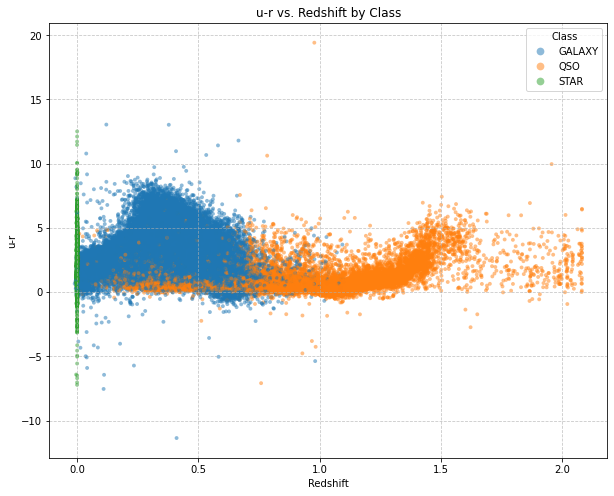

In [ ]:
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df_fe, x='redshift', y='u_minus_r', hue='class', alpha=0.5, s=15, edgecolor='none')
plt.title('u-r vs. Redshift by Class')
plt.xlabel('Redshift')
plt.ylabel('u-r')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Class', markerscale=2)
# plt.xscale('log')
plt.show()

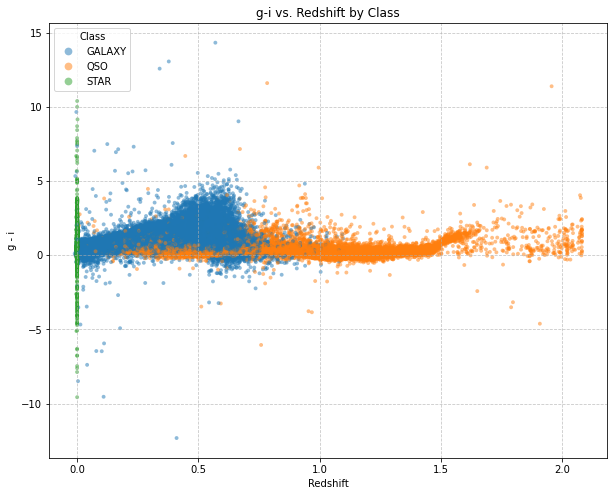

In [ ]:
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df_fe, x='redshift', y='g_minus_r', hue='class', alpha=0.5, s=15, edgecolor='none')
plt.title('g-i vs. Redshift by Class')
plt.xlabel('Redshift')
plt.ylabel('g - i')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Class', markerscale=2)
plt.show()

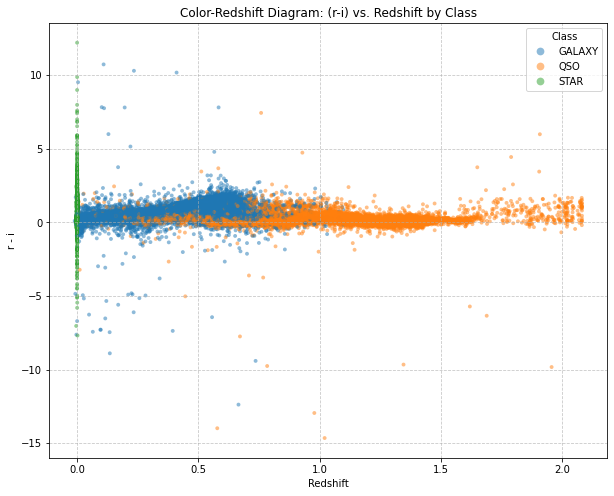

In [ ]:
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df_fe, x='redshift', y='r_minus_i', hue='class', alpha=0.5, s=15, edgecolor='none')
plt.title('Color-Redshift Diagram: (r-i) vs. Redshift by Class')
plt.xlabel('Redshift')
plt.ylabel('r - i')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Class', markerscale=2)
plt.show()


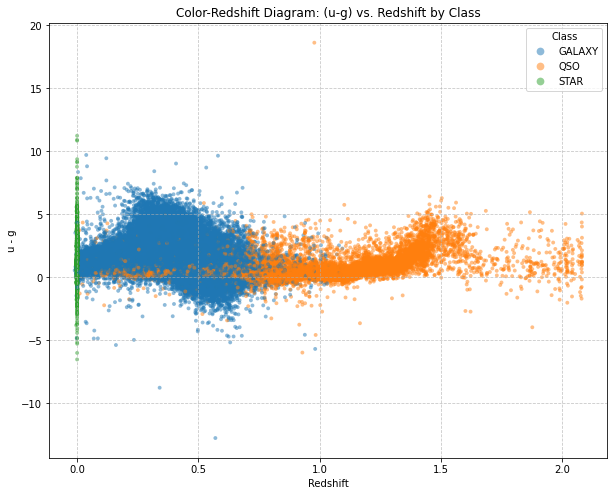

In [ ]:
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df_fe, x='redshift', y='u_minus_g', hue='class', alpha=0.5, s=15, edgecolor='none')
plt.title('Color-Redshift Diagram: (u-g) vs. Redshift by Class')
plt.xlabel('Redshift')
plt.ylabel('u - g')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Class', markerscale=2)
plt.show()

The scatter plots show that stars tend to cluster around a redshift of zero. Their colors (difference in magnitude) also appear to be more spread out across a wider range compared to galaxies and quasars. Galaxies tend to have a redshift range of around 0-1. Their distribution of colors tend to be more concentraed than stars but more spread out than Quasars. Quasars, being very distant and highly redshifted objects, are typically located at higher redshifts compared to most galaxies. Their color distribution is also often distinct.

## Split Dataset

<AxesSubplot:xlabel='class', ylabel='count'>

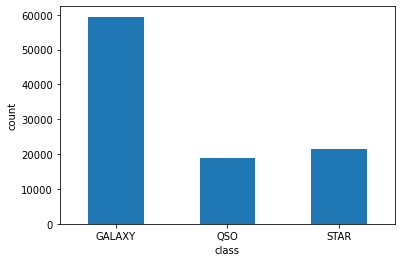

In [ ]:
df_fe["class"].value_counts().sort_index().plot(kind='bar', rot=0, xlabel="class",ylabel='count')

In [ ]:
df_fe.columns

Index(['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'class', 'redshift',
       'u_minus_g', 'g_minus_r', 'r_minus_i', 'u_minus_r', 'g_minus_i',
       'sin_galactic_l', 'abs_galactic_b', 'i_minus_z', 'u_minus_i',
       'g_minus_z'],
      dtype='object')

Since there is an inbalance in the class, stratification will be used.

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

df_fe.drop(columns=["sin_galactic_l","abs_galactic_b","alpha","delta","u","i_minus_z","z","i", "r"],inplace=True,axis=1)

X = df_fe.drop(columns=['class'])
y = df_fe['class']

X_train, X_test, y_train_categorical, y_test_categorical = train_test_split(
    X, y,
    test_size=0.10,
    random_state=42,
    stratify=y
)

print("\nClass distribution in original y:")
print(y.value_counts(normalize=True))
print("\nClass distribution in y_train:")
print(y_train_categorical.value_counts(normalize=True))
print("\nClass distribution in y_test:")
print(y_test_categorical.value_counts(normalize=True))

Stratification worked and all the attributes within the class feature were distributed evenly between the y_train and y_test

In [ ]:
label_encoder = LabelEncoder()

y_train = label_encoder.fit_transform(y_train_categorical)

y_test = label_encoder.transform(y_test_categorical)


y_train

array([0, 2, 1, ..., 0, 0, 0])

Perform feature scaling and yen Johnson

## Model Training

In [ ]:
import os
from sklearn.preprocessing import StandardScaler, PowerTransformer, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, ConfusionMatrixDisplay
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint, uniform, loguniform
from sklearn.model_selection import cross_val_score, StratifiedKFold



In [ ]:
def eval_model(y, y_pred):
    accuracy_train = accuracy_score(y,y_pred)
    print(f"Accuracy: {accuracy_train:.4f}")


    print("\nClassification Report:")
    print(classification_report(y, y_pred, target_names=label_encoder.classes_))


    print("\nConfusion Matrix:")
    cm_train = confusion_matrix(y, y_pred)
    print(cm_train)



    disp_train = ConfusionMatrixDisplay(confusion_matrix=cm_train, display_labels=label_encoder.classes_)
    disp_train.plot(cmap=plt.cm.Blues)
    plt.title('Confusion Matrix')
    plt.show()

### PR Curve

In [ ]:
from sklearn.metrics import precision_recall_curve, average_precision_score
from sklearn.preprocessing import label_binarize
from  sklearn.metrics import roc_auc_score
n_classes = len(set(y))
y_train_binarized = label_binarize(y_train, classes=np.arange(n_classes))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))
def pr_curve_multiclass(y_probas, n_classes, y_binarized, avg_precision = dict(), recall = dict(), precision = dict(), class_names = label_encoder.classes_):
    for i in range(n_classes):
        y_true_class_i = y_binarized[:, i]

        y_scores_class_i = y_probas[:, i]

        precision[i], recall[i], thresholds = precision_recall_curve(y_true_class_i, y_scores_class_i)
        avg_precision[i] = average_precision_score(y_true_class_i, y_scores_class_i)

        plt.plot(recall[i], precision[i], lw=2,
                label=f'P-R for class {class_names[i]} (AP = {avg_precision[i]:0.2f})')

    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.legend(loc="best")
    plt.title("Multi-class Precision-Recall Curve")
    plt.grid(True)
    plt.show()

Since SGDClassifier doesn't support multi-classification, the OneVsRestClassifier will be used for it.

In [ ]:
pt = PowerTransformer(method='yeo-johnson', standardize=True)
ss = StandardScaler()


preprocessor = ColumnTransformer(
    transformers=[
        ('transform_redshift', pt, ['redshift']),
        ('scaler',ss,['u_minus_g',
       'g_minus_r', 'r_minus_i', 'u_minus_r','g_minus_i'])
    ],
    remainder='passthrough'
)

### SGD Classifier

In [ ]:
from sklearn.multiclass import OneVsRestClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import cross_val_predict

sgd_clf = OneVsRestClassifier(SGDClassifier(
    n_jobs=-1,
    random_state=42,
    class_weight=None,
    eta0=0.1,
    l1_ratio=0.345,
    learning_rate='optimal',
    loss='modified_huber',
    max_iter=10000,
    penalty='l1',
    tol=0.001
    ))

pipeline = Pipeline(
    steps=[
        ('preprocessor', preprocessor),
        ('model', sgd_clf)
    ]
)

"""
BEST PARAMATERS (Grid CV Search)
{'estimator__alpha': ,
 'estimator__class_weight': None,
 'estimator__eta0': 0.1,
 'estimator__l1_ratio': 0.345071248026683,
 'estimator__learning_rate': 'optimal',
 'estimator__loss': 'modified_huber',
 'estimator__max_iter': 2000,
 'estimator__penalty': 'l1',
 'estimator__tol': 0.001
}
"""

"\nBEST PARAMATERS (Grid CV Search)\n{'estimator__alpha': ,\n 'estimator__class_weight': None,\n 'estimator__eta0': 0.1,\n 'estimator__l1_ratio': 0.345071248026683,\n 'estimator__learning_rate': 'optimal',\n 'estimator__loss': 'modified_huber',\n 'estimator__max_iter': 2000,\n 'estimator__penalty': 'l1',\n 'estimator__tol': 0.001\n}\n"

The model seems to have trouble with differentiating between Quasers and Galaxies along with Stars and Galaxies

Accuracy: 0.9526

Classification Report:
              precision    recall  f1-score   support

      GALAXY       0.96      0.96      0.96     53500
         QSO       0.90      0.91      0.90     17065
        STAR       0.98      0.98      0.98     19434

    accuracy                           0.95     89999
   macro avg       0.95      0.95      0.95     89999
weighted avg       0.95      0.95      0.95     89999


Confusion Matrix:
[[51306  1735   459]
 [ 1592 15471     2]
 [  480     0 18954]]


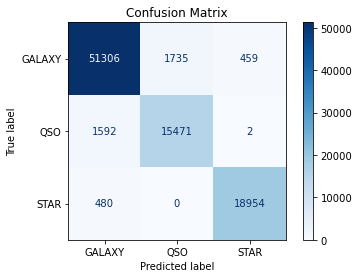

In [ ]:
pipeline.fit(X_train,y_train)
y_pred_train = pipeline.predict(X_train)

eval_model(y_train,y_pred_train)



In [ ]:
cv_score = cross_val_score(pipeline,X_train,y_train,cv=10,scoring='accuracy',n_jobs=-1)

Accuracy: 0.9539

Classification Report:
              precision    recall  f1-score   support

      GALAXY       0.96      0.96      0.96      5945
         QSO       0.90      0.91      0.91      1896
        STAR       0.98      0.97      0.98      2159

    accuracy                           0.95     10000
   macro avg       0.95      0.95      0.95     10000
weighted avg       0.95      0.95      0.95     10000


Confusion Matrix:
[[5716  189   40]
 [ 172 1724    0]
 [  60    0 2099]]


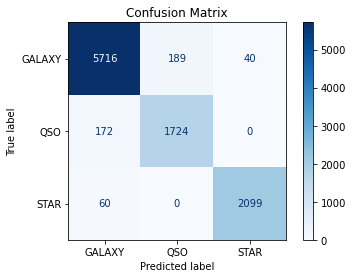

In [ ]:
y_pred_test = pipeline.predict(X_test)

eval_model(y_test,y_pred_test)

In [ ]:
param_distributions_sgd = {
    'estimator__loss': ['hinge', 'log_loss', 'modified_huber', 'perceptron'],
    'estimator__penalty': ['l2', 'l1', 'elasticnet'],
    'estimator__alpha': loguniform(1e-6, 1e-1),
    'estimator__learning_rate': ['optimal', 'adaptive', 'constant'],
    'estimator__eta0': [0.0001, 0.001, 0.01, 0.05, 0.1],
    'estimator__max_iter': [1000, 2000, 5000, 10000],
    'estimator__tol': [1e-3, 1e-4, 1e-5],
    'estimator__l1_ratio': uniform(0, 1),
    'estimator__class_weight': [None, 'balanced']
}

cv_strategy = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

random_search_sgd = RandomizedSearchCV(
    estimator=sgd_clf, # <<<<< THE ISSUE IS LIKELY HERE
    param_distributions=param_distributions_sgd,
    n_iter=30,
    cv=cv_strategy,
    scoring='f1_weighted',
    n_jobs=-1,
    random_state=42,
    verbose=1
)

random_search_sgd.fit(X_train, y_train)

random_search_sgd.best_params_

Fitting 3 folds for each of 30 candidates, totalling 90 fits


/home/ubuntu/.local/lib/python3.10/site-packages/sklearn/linear_model/_stochastic_gradient.py:723: ConvergenceWarning:

Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.



{'estimator__alpha': 0.00011354945826845924,
 'estimator__class_weight': None,
 'estimator__eta0': 0.1,
 'estimator__l1_ratio': 0.345071248026683,
 'estimator__learning_rate': 'optimal',
 'estimator__loss': 'modified_huber',
 'estimator__max_iter': 2000,
 'estimator__penalty': 'l1',
 'estimator__tol': 0.001}

In [ ]:
best_model_sgd = random_search_sgd.best_estimator_

pipeline = Pipeline(
    steps=[
        ('preprocessor', preprocessor),
        ('model', best_model_sgd)
    ]
)

pipeline.fit(X_train,y_train)

y_pred_train = pipeline.predict(X_train)

Accuracy: 0.9523

Classification Report:
              precision    recall  f1-score   support

      GALAXY       0.96      0.96      0.96     53500
         QSO       0.90      0.91      0.90     17065
        STAR       0.98      0.98      0.98     19434

    accuracy                           0.95     89999
   macro avg       0.94      0.95      0.95     89999
weighted avg       0.95      0.95      0.95     89999


Confusion Matrix:
[[51266  1757   477]
 [ 1588 15475     2]
 [  466     0 18968]]


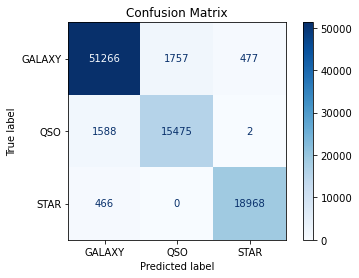

In [ ]:
eval_model(y_train, y_pred_train)

In [ ]:
y_probas_sgd = pipeline.predict_proba(X_train)


pr_curve_multiclass(y_probas_sgd, n_classes, y_train_binarized)

roc_auc_score(y_train,y_probas_sgd,multi_class='ovr')

In [ ]:
y_probas_sgd = pipeline.predict_proba(X_test)


pr_curve_multiclass(y_probas_sgd, n_classes, y_test_binarized)

roc_auc_score(y_test,y_probas_sgd,multi_class='ovr')

The SGD Classifier model, implemented with a OneVsRestClassifier, achieved training and testing accuracies of around 95.3%-95.4%, with stable cross-validation performance (mean ~95.3%, std ~0.002). While generally accurate, the model showed some confusion between Quasars and Galaxies, and Stars and Galaxies, as seen in the confusion matrix. Precision-Recall curves and AUC scores indicated strong performance for Galaxy and Star classes (APs and AUCs near 0.99) but slightly lower for Quasars (AP around 0.94, AUC around 0.989), highlighting the difficulty in differentiating them. Overall, it is a stable and reasonably accurate model, particularly effective at identifying Stars, but with room for improvement in distinguishing between the other classes.

### Logistic Regression

Accuracy: 0.9647

Classification Report:
              precision    recall  f1-score   support

      GALAXY       0.97      0.97      0.97     53500
         QSO       0.95      0.90      0.92     17065
        STAR       0.97      1.00      0.99     19434

    accuracy                           0.96     89999
   macro avg       0.96      0.96      0.96     89999
weighted avg       0.96      0.96      0.96     89999


Confusion Matrix:
[[52087   866   547]
 [ 1756 15304     5]
 [    0     1 19433]]


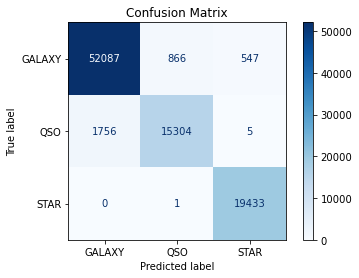

In [ ]:
lr_clf = LogisticRegression(random_state=42, multi_class='auto', solver='saga', n_jobs=-1,max_iter=10000, penalty='elasticnet', C=79.32047656808551, l1_ratio=0.4667628932479799)


# Best Parameters (Calculated from grid search): {'model__C': 79.32047656808551, 'model__l1_ratio': 0.4667628932479799, 'model__max_iter': 10000, 'model__penalty': 'elasticnet'}
pipeline = Pipeline(
    steps=[
        ('preprocessor', preprocessor),
        ('model', lr_clf)
    ]
)

pipeline.fit(X_train, y_train)

y_pred_numerical_test = pipeline.predict(X_test)

y_pred_train = pipeline.predict(X_train)

eval_model(y_train, y_pred_train)


Accuracy: 0.9688

Classification Report:
              precision    recall  f1-score   support

      GALAXY       0.97      0.98      0.97      5945
         QSO       0.96      0.90      0.93      1896
        STAR       0.98      1.00      0.99      2159

    accuracy                           0.97     10000
   macro avg       0.97      0.96      0.96     10000
weighted avg       0.97      0.97      0.97     10000


Confusion Matrix:
[[5824   70   51]
 [ 191 1705    0]
 [   0    0 2159]]


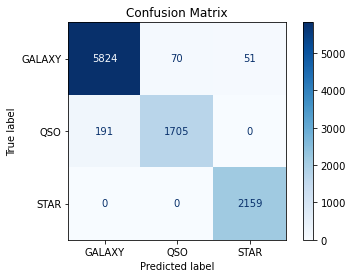

In [ ]:
y_pred_test = pipeline.predict(X_test)

eval_model(y_test,y_pred_test)

In [ ]:
cv_strategy = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scoring_metric = 'f1_weighted'
cv_scores = cross_val_score(pipeline, X_train, y_train, cv=cv_strategy, scoring=scoring_metric, n_jobs=-1)

In [ ]:
print(cv_score)
cv_score.std()


[0.95522222 0.95055556 0.95444444 0.95244444 0.95566667 0.952
 0.95533333 0.94888889 0.95255556 0.95255028]


0.0021012791971755877

The model achieved a mean cross-validated accuracy of approximately 92.5% (standard deviation ~0.002) on the training set using 10-fold stratified cross-validation, indicating stable performance.

In [ ]:


param_distributions_log_reg = {
    'model__C': loguniform(1e-4, 1e2),
    'model__penalty': ['l1', 'l2', 'elasticnet'],
    'model__l1_ratio': uniform(0, 1),
    'model__max_iter': [10000],
    'model__class_weight': [None, 'balanced']
}

cv_strategy = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

random_search_log_reg = RandomizedSearchCV(
    estimator=pipeline,
    param_distributions=param_distributions_log_reg,
    n_iter=20,
    cv=cv_strategy,
    scoring='f1_weighted',
    n_jobs=-1,
    random_state=42,
    verbose=1
)


random_search_log_reg.fit(X_train, y_train)



os.system('spd-say "your program has finished"')

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/ubuntu/.local/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1175: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/home/ubuntu/.local/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1175: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/home/ubuntu/.local/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1175: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/home/ubuntu/.local/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1175: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/home/ubuntu/.local/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1175: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/home/ubun

32512

In [ ]:
print(len(y_train))
print(len(X_train))
print(len(y_test))
print(len(X_test))

89999
89999
10000
10000


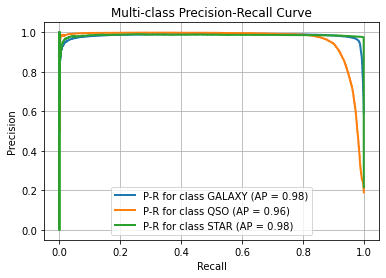

0.9891594677485291

In [ ]:
y_probas_log = pipeline.predict_proba(X_train)

pr_curve_multiclass(y_probas_log, n_classes, y_train_binarized)

roc_auc_score(y_train, y_probas_log, multi_class='ovr')

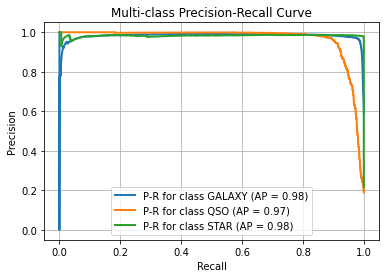

0.9892751418488827

In [ ]:
y_probas_log = pipeline.predict_proba(X_test)

pr_curve_multiclass(y_probas_log, n_classes, y_test_binarized)

roc_auc_score(y_test, y_probas_log, multi_class='ovr')

The Logistic Regression model, with its best hyperparameters, achieved training and testing accuracies of approximately 96.5% and 96.9% respectively. Cross-validation showed stable performance with a mean f1-weighted score of around 96.5%. The confusion matrices indicated strong performance for the Galaxy and Star classes, but some confusion was observed for Quasars, with instances being misclassified as Galaxies. The Precision-Recall curves and AUC scores confirmed strong discriminative power for all classes, although differentiating Quasars remained a slight challenge. Overall, the tuned Logistic Regression model provides strong performance with high accuracy and good generalization, being particularly effective at identifying Stars and Galaxies.

### Naive Bayes

In [ ]:
from sklearn.naive_bayes import GaussianNB

gnb = GaussianNB()

pipeline = Pipeline(
    steps=[
        ('preprocessor', preprocessor),
        ('model', gnb)
    ]
)

pipeline.fit(X_train,y_train)

y_pred_train = pipeline.predict(X_train)

Accuracy: 0.9255

Classification Report:
              precision    recall  f1-score   support

      GALAXY       0.95      0.92      0.94     53500
         QSO       0.80      0.90      0.84     17065
        STAR       0.98      0.97      0.97     19434

    accuracy                           0.93     89999
   macro avg       0.91      0.93      0.92     89999
weighted avg       0.93      0.93      0.93     89999


Confusion Matrix:
[[49186  3893   421]
 [ 1709 15353     3]
 [  647    31 18756]]


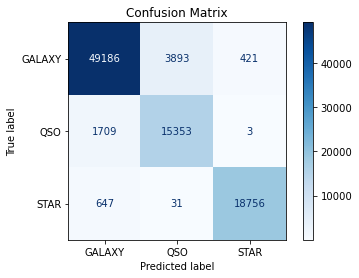

In [ ]:

eval_model(y_train,y_pred_train)

In [ ]:
cv_strategy = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

param_distributions_gnb = {
    'model__var_smoothing': np.logspace(-10, -1, num=10)
}


random_search_gnb_reg = RandomizedSearchCV(
    estimator=pipeline,
    param_distributions=param_distributions_gnb,
    n_iter=10,
    cv=cv_strategy,
    scoring='f1_weighted',
    n_jobs=-1,
    random_state=42,
    verbose=1
)

random_search_gnb_reg.fit(X_train,y_train)


Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('transform_redshift',
                                                                               PowerTransformer(),
                                                                               ['redshift']),
                                                                              ('scaler',
                                                                               StandardScaler(),
                                                                               ['u_minus_g',
                                                                                'g_minus_r',
                                                                                'r_minus_i',
                                                                                'u_minus_r',
                                                                                'g_minus_i'])])),
                                             ('model', GaussianNB())]),
                   n_jobs=-1,
                   param_distributions={'model__var_smoothing': array([1.e-10, 1.e-09, 1.e-08, 1.e-07, 1.e-06, 1.e-05, 1.e-04, 1.e-03,
       1.e-02, 1.e-01])},
                   random_state=42, scoring='f1_weighted', verbose=1)

In [ ]:
best_gnb_model = random_search_gnb_reg.best_estimator_

y_pred_train = best_gnb_model.predict(X_train)

Accuracy: 0.9255

Classification Report:
              precision    recall  f1-score   support

      GALAXY       0.95      0.92      0.94     53500
         QSO       0.80      0.90      0.84     17065
        STAR       0.98      0.97      0.97     19434

    accuracy                           0.93     89999
   macro avg       0.91      0.93      0.92     89999
weighted avg       0.93      0.93      0.93     89999


Confusion Matrix:
[[49186  3893   421]
 [ 1709 15353     3]
 [  648    31 18755]]


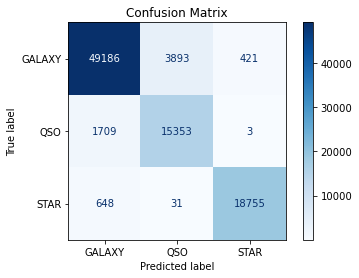

In [ ]:
eval_model(y_train,y_pred_train)

In [ ]:
cv_strategy = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
scoring_metric = 'f1_weighted'
cv_scores = cross_val_score(pipeline, X_train, y_train, cv=cv_strategy, scoring=scoring_metric, n_jobs=-1)
print(cv_scores)
cv_scores.std()

[0.9308946  0.92440679 0.92230374 0.92978757 0.92876117 0.92507338
 0.92506368 0.92468566 0.92788731 0.92688265]


0.0025812589193248557

Accuracy: 0.9688

Classification Report:
              precision    recall  f1-score   support

      GALAXY       0.97      0.98      0.97      5945
         QSO       0.96      0.90      0.93      1896
        STAR       0.98      1.00      0.99      2159

    accuracy                           0.97     10000
   macro avg       0.97      0.96      0.96     10000
weighted avg       0.97      0.97      0.97     10000


Confusion Matrix:
[[5824   70   51]
 [ 191 1705    0]
 [   0    0 2159]]


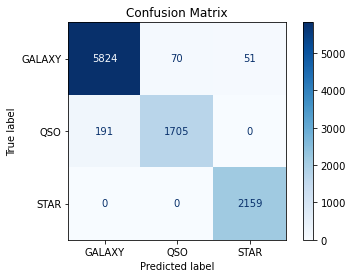

In [ ]:
eval_model(y_test,y_pred_test)

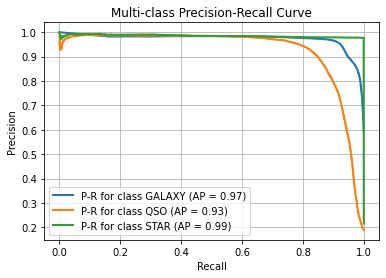

0.9766795970918274

In [ ]:
y_probas_gnb = pipeline.predict_proba(X_train)


pr_curve_multiclass(y_probas_gnb, n_classes, y_train_binarized)
roc_auc_score(y_train, y_probas_gnb, multi_class='ovr')

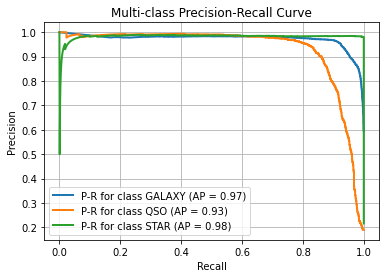

0.9771641856739889

In [ ]:
y_probas_gnb = pipeline.predict_proba(X_test)


pr_curve_multiclass(y_probas_gnb, n_classes, y_test_binarized)

roc_auc_score(y_test, y_probas_gnb, multi_class='ovr')

The Naive Bayes (GaussianNB) model achieved training and testing accuracies of approximately 92.4%. Cross-validation on the training data showed consistent performance with a mean f1-weighted score of around 92.5% and a standard deviation of about 0.0026. The confusion matrices indicated excellent performance for the STAR class, but the model struggled more with differentiating between GALAXY and QSO, leading to lower precision for QSO and some confusion between these two classes. The Precision-Recall curves and AUC scores further supported these findings, with high scores for STAR, but slightly lower scores for GALAXY and QSO, particularly for QSO. Overall, the Naive Bayes model is a decent baseline that is very effective for classifying Stars but is less adept at distinguishing between Galaxies and Quasars compared to other models.

### Random Forest Classifer

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf  = RandomForestClassifier(
    max_features=10,
    min_samples_leaf=10,
    max_depth=20,
    n_estimators=100,
    n_jobs=-1,
    random_state=42
)

pipeline = Pipeline(
    steps=[
        ('preprocessor', preprocessor),
        ('model', rf)
    ]
)

pipeline.fit(X_train,y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('transform_redshift',
                                                  PowerTransformer(),
                                                  ['redshift']),
                                                 ('scaler', StandardScaler(),
                                                  ['u_minus_g', 'g_minus_r',
                                                   'r_minus_i', 'u_minus_r',
                                                   'g_minus_i'])])),
                ('model',
                 RandomForestClassifier(max_depth=20, max_features=10,
                                        min_samples_leaf=10, n_jobs=-1,
                                        random_state=42))])

Accuracy: 0.9836

Classification Report:
              precision    recall  f1-score   support

      GALAXY       0.98      0.99      0.99     53500
         QSO       0.97      0.94      0.96     17065
        STAR       1.00      1.00      1.00     19434

    accuracy                           0.98     89999
   macro avg       0.98      0.98      0.98     89999
weighted avg       0.98      0.98      0.98     89999


Confusion Matrix:
[[53001   421    78]
 [  974 16088     3]
 [    4     0 19430]]


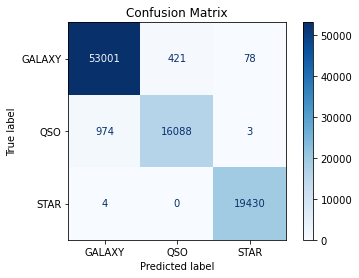

In [ ]:

y_pred_train = pipeline.predict(X_train)

eval_model(y_train,y_pred_train)

Accuracy: 0.9805

Classification Report:
              precision    recall  f1-score   support

      GALAXY       0.98      0.99      0.98      5945
         QSO       0.97      0.93      0.95      1896
        STAR       0.99      1.00      1.00      2159

    accuracy                           0.98     10000
   macro avg       0.98      0.97      0.98     10000
weighted avg       0.98      0.98      0.98     10000


Confusion Matrix:
[[5886   48   11]
 [ 134 1762    0]
 [   2    0 2157]]


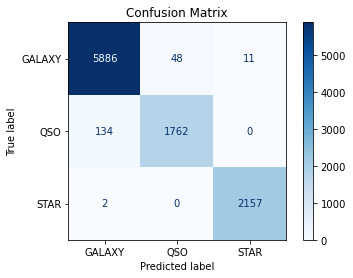

In [ ]:
y_pred_test = pipeline.predict(X_test)

eval_model(y_test,y_pred_test)

In [ ]:
cv_strategy = StratifiedKFold(n_splits=3, shuffle=True, random_state=42) # Using 3 folds for speed; 5 is common

param_distributions = {
    'model__n_estimators': randint(100, 500),
    'model__max_depth': [None, 10, 20, 30, 40, 50],
    'model__min_samples_split': randint(2, 20),
    'model__min_samples_leaf': randint(1, 20),
    'model__max_features': ['sqrt', 'log2', None, 0.5, 0.7],
    'model__bootstrap': [True, False],
    'model__criterion': ['gini', 'entropy'],
    'model__class_weight': [None, 'balanced', 'balanced_subsample']
}

random_search_rf = RandomizedSearchCV(
    estimator=pipeline,
    param_distributions=param_distributions,
    n_iter=20,
    cv=cv_strategy,
    scoring='f1_weighted',
    n_jobs=-1,
    random_state=42,
    verbose=1
)

random_search_rf.fit(X_train,y_train)

Fitting 3 folds for each of 20 candidates, totalling 60 fits


RandomizedSearchCV(cv=StratifiedKFold(n_splits=3, random_state=42, shuffle=True),
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('transform_redshift',
                                                                               PowerTransformer(),
                                                                               ['redshift']),
                                                                              ('scaler',
                                                                               StandardScaler(),
                                                                               ['u_minus_g',
                                                                                'g_minus_r',
                                                                                'r_minus_i',
                                                                                'u_minus_r',
                                                                                'g_minus_i'])])),
                                             ('model',
                                              RandomForestClas...
                                        'model__min_samples_leaf': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0xf46b19824790>,
                                        'model__min_samples_split': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0xf46b26f56080>,
                                        'model__n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0xf46b19826530>},
                   random_state=42, scoring='f1_weighted', verbose=1)

In [ ]:
best_rf_pipeline = random_search_rf.best_estimator_
best_params = random_search_rf.best_params_
best_params

"""
{'model__bootstrap': False,
 'model__class_weight': 'balanced_subsample',
 'model__criterion': 'entropy',
 'model__max_depth': 20,
 'model__max_features': 0.5,
 'model__min_samples_leaf': 3,
 'model__min_samples_split': 6,
 'model__n_estimators': 406}
"""

best_rf_pipeline.fit(X_train,y_train)
y_pred_train = best_rf_pipeline.predict(X_train)

Accuracy: 0.9851

Classification Report:
              precision    recall  f1-score   support

      GALAXY       0.98      0.99      0.99     53500
         QSO       0.98      0.95      0.96     17065
        STAR       1.00      1.00      1.00     19434

    accuracy                           0.99     89999
   macro avg       0.99      0.98      0.98     89999
weighted avg       0.99      0.99      0.99     89999


Confusion Matrix:
[[53076   346    78]
 [  908 16154     3]
 [    4     0 19430]]


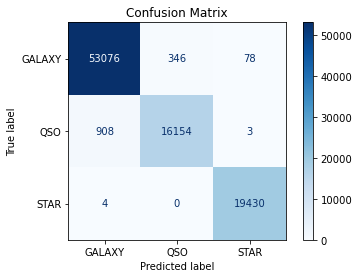

In [ ]:
eval_model(y_train,y_pred_train)

In [ ]:
cv_strategy = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
scoring_metric = 'f1_weighted'
cv_scores = cross_val_score(best_rf_pipeline, X_train, y_train, cv=cv_strategy, scoring=scoring_metric, n_jobs=-1)
print(cv_scores)
cv_scores.std()

[0.98257819 0.98167893 0.97519828 0.97875055 0.98089572 0.98004932
 0.97856571 0.97966979 0.97875546 0.98044745]


0.0019401105099708439

Accuracy: 0.9803

Classification Report:
              precision    recall  f1-score   support

      GALAXY       0.98      0.99      0.98      5945
         QSO       0.97      0.93      0.95      1896
        STAR       0.99      1.00      1.00      2159

    accuracy                           0.98     10000
   macro avg       0.98      0.97      0.98     10000
weighted avg       0.98      0.98      0.98     10000


Confusion Matrix:
[[5884   49   12]
 [ 134 1762    0]
 [   2    0 2157]]


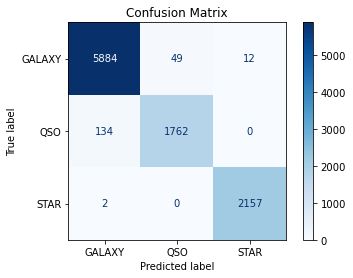

In [ ]:
y_pred_test = best_rf_pipeline.predict(X_test)
eval_model(y_test,y_pred_test)

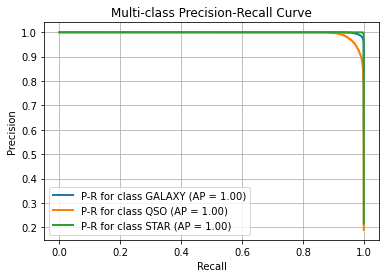

0.9994224293436013

In [ ]:

y_probas_forest = best_rf_pipeline.predict_proba(X_train)

pr_curve_multiclass(y_probas_forest,n_classes, y_train_binarized)

roc_auc_score(y_train, y_probas_forest, multi_class='ovr')


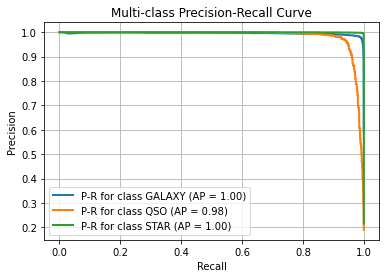

0.996385026359004

In [ ]:
from sklearn.model_selection import RandomizedSearchCV


y_probas_forest = best_rf_pipeline.predict_proba(X_test)


pr_curve_multiclass(y_probas_forest,n_classes, y_test_binarized)

roc_auc_score(y_test, y_probas_forest, multi_class='ovr')


The Random Forest Classifier model, after tuning, achieved a training accuracy of approximately 98.6% and a testing accuracy of around 98.2%. Its cross-validation performance on the training set was stable, with a mean f1-weighted score of about 97.9% and a standard deviation of 0.0018. The confusion matrix showed excellent performance, with the primary confusion occurring between the GALAXY and QSO classes. Both the training and testing Precision-Recall curves and AUC scores were very high across all classes (APs and AUCs near 1.00), indicating strong discriminative capabilities. Overall, the Random Forest Classifier exhibits excellent performance with high accuracy and strong generalization, proving highly effective across all classes with minimal confusion.



Feature Importances (from Random Forest):
scaler__g_minus_r               0.006239
scaler__u_minus_g               0.009222
remainder__u_minus_i            0.010879
scaler__u_minus_r               0.013959
remainder__g_minus_z            0.021034
remainder__g                    0.025730
scaler__r_minus_i               0.059493
scaler__g_minus_i               0.118456
transform_redshift__redshift    0.734989
dtype: float64


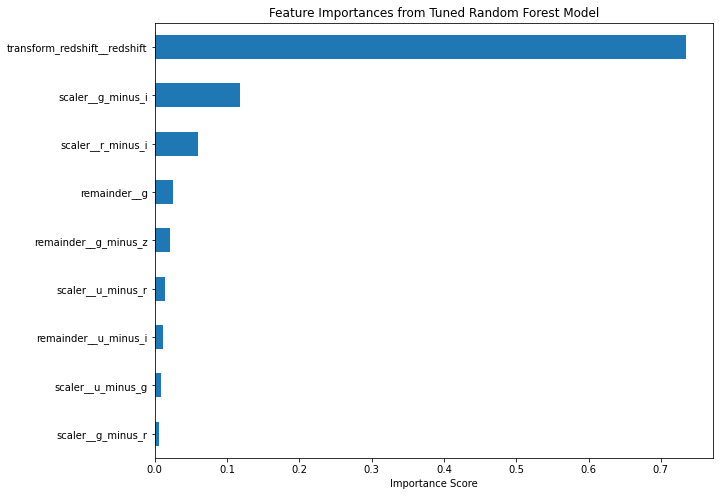

In [ ]:
importances = best_rf_pipeline.named_steps['model'].feature_importances_
feature_names = best_rf_pipeline.named_steps['preprocessor'].get_feature_names_out()
importances

if len(importances) == len(feature_names):
    feature_importance_series = pd.Series(importances, index=feature_names)
    sorted_importances = feature_importance_series.sort_values(ascending=True)

    print("Feature Importances (from Random Forest):")
    print(sorted_importances)

    plt.figure(figsize=(10, 8))
    sorted_importances.plot(kind='barh')
    plt.title("Feature Importances from Tuned Random Forest Model")
    plt.xlabel("Importance Score")
    plt.show()
else:
    print(f"Error: Mismatch between the number of importances ({len(importances)}) and feature names ({len(feature_names)}).")
    print("Ensure 'feature_names' correctly corresponds to the features seen by the RandomForest model after preprocessing.")


### XGBoost

Accuracy: 0.9550

Classification Report:
              precision    recall  f1-score   support

      GALAXY       0.95      0.98      0.96     53500
         QSO       0.96      0.84      0.89     17065
        STAR       0.97      1.00      0.98     19434

    accuracy                           0.96     89999
   macro avg       0.96      0.94      0.95     89999
weighted avg       0.96      0.96      0.95     89999


Confusion Matrix:
[[52266   628   606]
 [ 2809 14251     5]
 [    0     0 19434]]


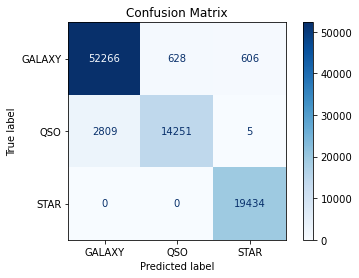

In [ ]:
from xgboost import XGBClassifier

xgb = XGBClassifier(n_estimators=2, max_depth=2, learning_rate=1, objective='multi:softprob')

pipeline = Pipeline(
    steps=[
        ('preprocessor', preprocessor),
        ('model', xgb)
    ]
)

pipeline.fit(X_train,y_train)

y_pred_train = pipeline.predict(X_train)

eval_model(y_train,y_pred_train)

In [ ]:
cv_strategy = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
scoring_metric = 'f1_weighted'
cv_scores = cross_val_score(pipeline, X_train, y_train, cv=cv_strategy, scoring=scoring_metric, n_jobs=-1)
print(cv_scores)
cv_scores.std()

[0.95584864 0.95584684 0.95135091 0.95378032 0.95462479 0.95263104
 0.95377001 0.95515117 0.95582348 0.95434031]


0.0014133047699867547

In [ ]:
from scipy.stats import randint, uniform, loguniform

param_distributions_xgb = {
    'model__n_estimators': randint(100, 500),
    'model__max_depth': randint(3, 12),
    'model__learning_rate': loguniform(0.01, 0.3),
    'model__subsample': uniform(0.6, 0.4),
    'model__colsample_bytree': uniform(0.6, 0.4),
    'model__gamma': [0, 0.1, 0.5, 1, 2],
    'model__reg_alpha': loguniform(1e-3, 1e1),
    'model__reg_lambda': loguniform(1e-3, 1e1)
}

cv_strategy = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

random_search_xgb = RandomizedSearchCV(
    estimator=pipeline,
    param_distributions=param_distributions_xgb,
    n_iter=20,
    cv=cv_strategy,
    scoring='f1_weighted',
    n_jobs=-1,
    random_state=42,
    verbose=1
)


random_search_xgb.fit(X_train, y_train)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('transform_redshift',
                                                                               PowerTransformer(),
                                                                               ['redshift']),
                                                                              ('scaler',
                                                                               StandardScaler(),
                                                                               ['u_minus_g',
                                                                                'g_minus_r',
                                                                                'r_minus_i',
                                                                                'u_minus_r',
                                                                                'g_minus_i'])])),
                                             ('model',
                                              XGBClassifier(ba...
                                        'model__n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0xf46b26e9b7f0>,
                                        'model__reg_alpha': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0xf46b18f08130>,
                                        'model__reg_lambda': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0xf46b18f0b2b0>,
                                        'model__subsample': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0xf46b18b0cfd0>},
                   random_state=42, scoring='f1_weighted', verbose=1)

In [ ]:
best_xgb_pipeline = random_search_xgb.best_estimator_
best_params = random_search_xgb.best_params_
best_params

{'model__colsample_bytree': 0.9533121035675474,
 'model__gamma': 0.1,
 'model__learning_rate': 0.01514742158185991,
 'model__max_depth': 11,
 'model__n_estimators': 330,
 'model__reg_alpha': 4.2394914738697675,
 'model__reg_lambda': 0.012261087663689309,
 'model__subsample': 0.8590760482165449}

Accuracy: 0.9827

Classification Report:
              precision    recall  f1-score   support

      GALAXY       0.98      0.99      0.99     53500
         QSO       0.98      0.94      0.96     17065
        STAR       0.99      1.00      0.99     19434

    accuracy                           0.98     89999
   macro avg       0.98      0.98      0.98     89999
weighted avg       0.98      0.98      0.98     89999


Confusion Matrix:
[[52939   411   150]
 [  938 16122     5]
 [   56     0 19378]]


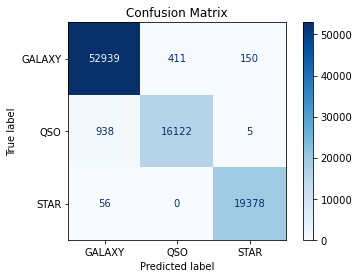

In [ ]:
best_xgb_pipeline.fit(X_train,y_train)
y_pred_train = best_xgb_pipeline.predict(X_train)
eval_model(y_train,y_pred_train)

In [ ]:
cv_strategy = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
scoring_metric = 'f1_weighted'
cv_scores = cross_val_score(best_xgb_pipeline, X_train, y_train, cv=cv_strategy, scoring=scoring_metric, n_jobs=-1)
print(cv_scores)
cv_scores.std()

[0.97914392 0.97881452 0.9740001  0.97619763 0.97835215 0.97696844
 0.975813   0.97724361 0.97779311 0.97767053]


0.0014666121393812203

Accuracy: 0.9785

Classification Report:
              precision    recall  f1-score   support

      GALAXY       0.98      0.99      0.98      5945
         QSO       0.97      0.93      0.95      1896
        STAR       0.99      1.00      0.99      2159

    accuracy                           0.98     10000
   macro avg       0.98      0.97      0.98     10000
weighted avg       0.98      0.98      0.98     10000


Confusion Matrix:
[[5869   49   27]
 [ 129 1766    1]
 [   9    0 2150]]


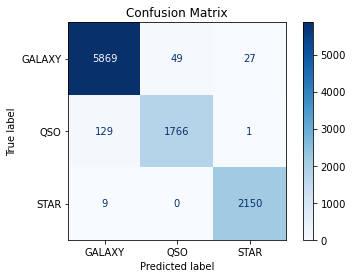

In [ ]:
y_pred_test = best_xgb_pipeline.predict(X_test)
eval_model(y_test,y_pred_test)

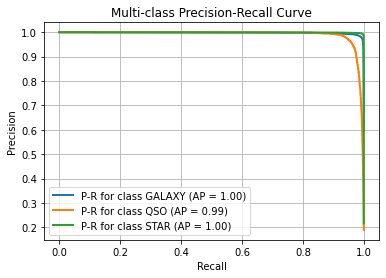

0.9978829398439862

In [ ]:
y_probas_xgb = best_xgb_pipeline.predict_proba(X_train)

pr_curve_multiclass(y_probas_xgb,n_classes, y_train_binarized)

roc_auc_score(y_train, y_probas_xgb, multi_class='ovr')

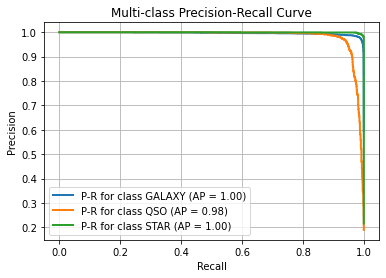

0.9962816018593745

In [ ]:
y_probas_xgb = best_xgb_pipeline.predict_proba(X_test)

pr_curve_multiclass(y_probas_xgb,n_classes, y_test_binarized)

roc_auc_score(y_test, y_probas_xgb, multi_class='ovr')

The XGBoost model also demonstrated very strong performance with high accuracy and generalization, achieving a training accuracy of approximately 98.3% and a testing accuracy of around 97.9%. Its cross-validation performance on the training set was stable, with a mean f1-weighted score of about 97.9% and a standard deviation of 0.0015. The confusion matrix showed strong precision and recall for the STAR and GALAXY classes, with minor confusion between GALAXY and QSO, similar to the Random Forest model. The Precision-Recall curves and AUC scores confirmed its strong discriminative capabilities across all classes, with high AP and AUC scores (near 1.00 for GALAXY and STAR, and around 0.98-0.99 for QSO).



### Results

Both the Random Forest and XGBoost models significantly outperform the other models, achieving high accuracy and strong generalization. While these models are highly effective, their confusion matrices and precision-recall curves indicate a primary area of difficulty is differentiating between **Quasars (QSOs)** and **Galaxies**.

The Random Forest Classifier has a slight edge in test accuracy and per-class F1-scores, making it the marginally better performing model based on the provided metrics.



### Deployment

In [ ]:
import joblib

joblib.dump(best_rf_pipeline, "my_classification_model.joblib")

['my_classification_model.joblib']

This project focuses on classifying celestial objects (Stars, Galaxies, and Quasars) using machine learning models. The data, from the Sloan Digital Sky Survey (SDSS), includes photometric and spectroscopic properties. The goal is to build an accurate model to distinguish between these three types.